# loaded libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os,gc
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score,roc_curve,auc,confusion_matrix
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb
import time
plt.style.use('seaborn-whitegrid')
import warnings
warnings.simplefilter("ignore")
colors = [x['color'] for x in plt.rcParams['axes.prop_cycle']]

C:\Users\lalit\AppData\Local\Temp\ipykernel_28024\247038982.py:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


In [ ]:
import plotly.express as px

In [1]:
pip install -U notebook-as-pdf


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.4/83.4 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.6/232.6 kB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.8/143.8 kB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 14.2 MB/s eta 0:00:00
  Attempting uninstall: urllib3
    Found existing installation: urllib3 2.0.7
    Uninstalling urllib3-2.0.7:
      Successfully uninstalled urllib3-2.0.7


________________________________________________________________________________________________________________________________________


# Table of Contents

## 1. **Exploratory Data Analysis (EDA)**
   1.1 **Data Collection**  
   1.2 **Data Preprocessing**  
   1.3 **Data Visualization**  <br>
      1.3.1 Univariate Analysis<br>
      1.3.2 Bivariate Analysis   <br>
      1.3.3 Descriptive Statistics <br>
   1.4 **Insights Extracted from Visualizations**  

## 2. **Machine Learning Approach**
   2.1 **Data Splitting**  
   2.2 **Feature Selection and Engineering**
   2.3 **Validation Set Selection**
   2.4 **Model Selection**  <br>
      2.3.1 Brief Overview of Selected Models  
      2.3.2 Justification for Model Selection  
   2.5 **RandomForestClassifier** <br>
      2.5.1 Training Process (params=Default)<br>
      2.5.1.1 Evaluation <br>
      2.5.2 Training Process (with GridSearchCV)<br>
      2.5.2.1 Evaluation  <br>
      2.5.3 Confusion Matrix<br>
   2.6 **XGBoostClassifie**<br>
      2.6.1 Training Process (with RandomizedSearchCV)<br>
      2.6.2 Metric Evaluation<br>
      2.6.3 Confusion Matrix <br>
   2.7 **Correlation Analysis** <br>
      2.7.1 Functions <br>
      2.7.2 Analysis on V columns<br>
      2.7.3 Analysis on M column<br>
      2.7.4 Analysis on D column<br>
   2.8 **Final Model with Feature Selection Reduce** <br>
      2.8.1 Train - Test Split <br>
      2.8.2 Preprocessing <br>
      2.8.3 Training Process on final model <br>
      2.8.4 Metric Evaluation <br>
      2.8.5 Confusion Matrix
  

## 3. **Submission File**
   


________________________________________________________________________________________________________________________________________

# 1. **Exploratory Data Analysis (EDA)**
   ## 1.1 Data Collection  
       This is a group work project for Machine Learning course in Master Programm M.Sc. Business Analytics and Big Data at IE School of Science and Technology 2024.


In [ ]:
df_train_transaction = pd.read_csv('train_transaction.csv')
df_train_identity = pd.read_csv('train_identity.csv')
df_train = df_train_transaction.merge(df_train_identity,on=['TransactionID'],how='left')
df_test_transaction = pd.read_csv('test_transaction.csv')
df_test_identity = pd.read_csv('test_identity.csv')

In [ ]:
df_test_identity.head()

,TransactionID,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,...,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
0,3663586,-45.0,280290.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
1,3663588,0.0,3579.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 67.0 for android,24.0,1280x720,match_status:2,T,F,T,T,mobile,LGLS676 Build/MXB48T
2,3663597,-5.0,185210.0,NaN,NaN,1.0,0.0,NaN,NaN,NaN,...,ie 11.0 for tablet,NaN,NaN,NaN,F,T,T,F,desktop,Trident/7.0
3,3663601,-45.0,252944.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
4,3663602,-95.0,328680.0,NaN,NaN,7.0,-33.0,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-G9650 Build/R16NW


## 1.2 Data Preprocessing  
    some columns (id) are wrongly labeled in test_identity. We will correct it

In [ ]:
#some columns (id) are wrongly labeled in test_identity. We will correct it
id_cols = [col for col in df_test_identity.columns if col[0]+col[1] == 'id']
rename_cols = {i:'id_'+str(i[-2]+i[-1]) for i in id_cols}
df_test_identity = df_test_identity.rename(columns=rename_cols)
df_test = df_test_transaction.merge(df_test_identity,on=['TransactionID'],how='left')
df_train.to_csv('train_combined.csv',index=False)
df_test.to_csv('test_combined.csv',index=False)

In [ ]:
df_train = pd.read_csv('train_combined.csv')
df_test = pd.read_csv('test_combined.csv')
print(df_train.shape)
print(df_test.shape)

(590540, 434)
(506691, 433)


In [ ]:
df_train.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M


We created a function which returns missing columns in dataframe with missing values over percent > withgiving threshold. If n=None: It will gave whole dataframe with missing values percent > thresh

In [ ]:
def top_missing_cols(df,n=10,thresh=80):
    """
    returns missing columns in dataframe with missing values percent > thresh
    if n=None. It will gave whole dataframe with missing values percent > thresh
    """

    dff = (df.isnull().sum()/df.shape[0])*100
    dff = dff.reset_index()
    dff.columns = ['col','missing_percent']
    dff = dff.sort_values(by=['missing_percent'],ascending=False).reset_index(drop=True)
    print(f'There are {df.isnull().any().sum()} columns in this dataset with missing values.')
    print(f'There are {dff[dff["missing_percent"] > thresh].shape[0]} columns with missing percent values than {thresh}%')
    if n:
        return dff.head(n)
    else:
        return dff

In [ ]:
top_missing_cols(df_train,thresh=90)

There are 414 columns in this dataset with missing values.
There are 12 columns with missing percent values than 90%


,col,missing_percent
0,id_24,99.196159
1,id_25,99.130965
2,id_07,99.127070
3,id_08,99.127070
4,id_21,99.126393
5,id_26,99.125715
6,id_27,99.124699
7,id_23,99.124699
8,id_22,99.124699
9,dist2,93.628374


In [ ]:
top_missing_cols(df_test,thresh=90)

There are 385 columns in this dataset with missing values.
There are 10 columns with missing percent values than 90%


,col,missing_percent
0,id_24,99.064519
1,id_25,99.005508
2,id_26,99.003929
3,id_21,99.001561
4,id_08,99.001561
5,id_07,99.001561
6,id_27,99.000969
7,id_23,99.000969
8,id_22,99.000969
9,dist2,92.809030


        Afterwads we iterated through a list of categorical columns in a dataset `cat_cols`. For each column, it concatenates the values from both training and test datasets, calculates the number of unique values (`sh`), and computes the percentage of missing values in that column. The results are then printed, displaying the number of unique values and the percentage of missing values for each categorical column.

In [ ]:
cat_cols = ['ProductCD','card1','card2','card3','card4','card5','card6','P_emaildomain','R_emaildomain','M1',
'M2','M3','M4','M5','M6','M7','M8','M9','id_12', 'id_13', 'id_14', 'id_15', 'id_16', 'id_17', 'id_18', 'id_19',
'id_20', 'id_21', 'id_22', 'id_23', 'id_24', 'id_25', 'id_26', 'id_27', 'id_28', 'id_29','addr1','addr2',
'id_30', 'id_31', 'id_32', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType', 'DeviceInfo']

for col in cat_cols:
    df = pd.concat([df_train[col],df_test[col]],axis=0)
    sh = df.value_counts().shape[0]
    missing = round((df.isnull().sum()/df.shape[0])*100,2)
    print(f'No of unique values in {col} is {sh} | missing percent is {missing}%')

No of unique values in ProductCD is 5 | missing percent is 0.0%
No of unique values in card1 is 17091 | missing percent is 0.0%
No of unique values in card2 is 501 | missing percent is 1.6%
No of unique values in card3 is 133 | missing percent is 0.42%
No of unique values in card4 is 4 | missing percent is 0.42%
No of unique values in card5 is 138 | missing percent is 0.8%
No of unique values in card6 is 4 | missing percent is 0.42%
No of unique values in P_emaildomain is 60 | missing percent is 14.91%
No of unique values in R_emaildomain is 60 | missing percent is 75.1%
No of unique values in M1 is 2 | missing percent is 40.81%
No of unique values in M2 is 2 | missing percent is 40.81%
No of unique values in M3 is 2 | missing percent is 40.81%
No of unique values in M4 is 3 | missing percent is 47.32%
No of unique values in M5 is 2 | missing percent is 60.16%
No of unique values in M6 is 2 | missing percent is 29.92%
No of unique values in M7 is 2 | missing percent is 52.98%
No of uni

## 1.3 Data Visualization  
### 1.3.1 Univariate Analysis  


#### 1.3.1.1 **IsFraud**

We started by inspecting the target variable first to see if there is a potential balance problem with the data

        We can see that this is an unbalanced problem.
        96.5% of the data is NON fraudulent
        3.49% is fraudulent

In [ ]:
df_train['isFraud'].value_counts()

isFraud
0    569877
1     20663
Name: count, dtype: int64

In [ ]:
df_train['isFraud'].value_counts(normalize=True)


isFraud
0    0.96501
1    0.03499
Name: proportion, dtype: float64

In [ ]:
px.pie(df_train,names='isFraud',title='Target Distribution')

#### 1.3.1.2 **TransactionDT**

This code calculates a time difference between the train and test datasets, ensuring that the test data occurs after the train data. Specifically, it verifies that the train data corresponds to an earlier time period, while the test data pertains to a later period. This validation is crucial for maintaining the chronological sequence of the data, which is essential for accurate analysis and modeling.


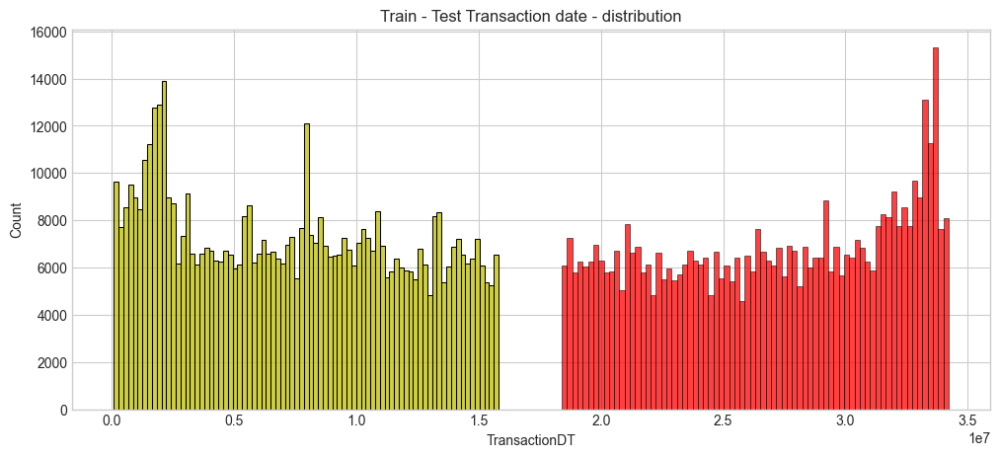

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=1,figsize=(12,5))
sns.histplot(df_train['TransactionDT'],color='y')
sns.histplot(df_test['TransactionDT'],color='r')
axes.title.set_text('Train - Test Transaction date - distribution')
plt.show()

    Looks like the train data(yellow) is from earlier period and test data(red) is from later, there is also a slight gap in between. This will be important factor in deciding fixed validation or cross validation.

    One more point is that there are certain days where the transactions are more than 10000

### 1.3.2 Bivariate Analysis  
#### 1.3.2.1 **dayofweek vs isFraud**
Now we performed a bivariate analysis to explore the relationship between the **day of the week** and **fraud transactions** in the `df_train` dataset.
It calculates the percentage of fraud transactions for each day of the week and also counts the total number of transactions for each day.

By visualizing this data using a **line plot** for fraud percentages and a **bar plot** for transaction counts, the code aims to uncover potential patterns or trends in fraud occurrences based on different days of the week.

This analysis is essential for understanding if fraud incidents are correlated with specific days, providing valuable insights for fraud detection strategies and resource allocation.

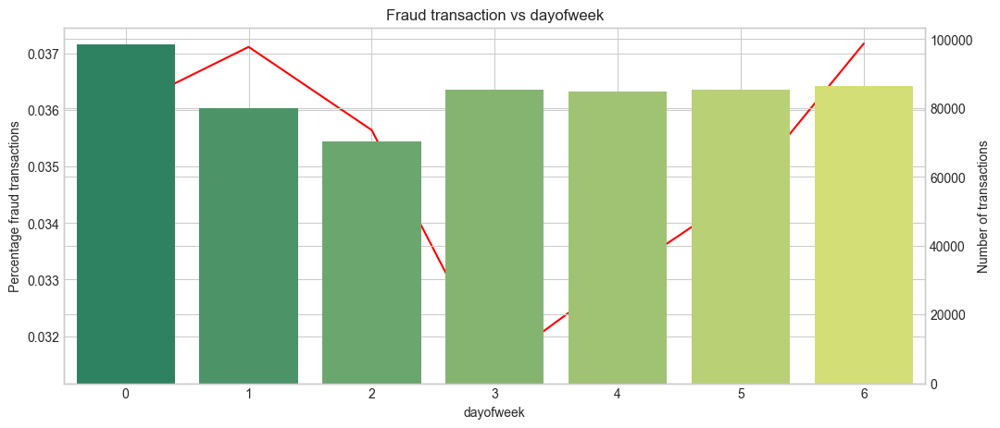

In [ ]:
df_train['dayofweek'] = (df_train['TransactionDT']//(60*60*24)-1)%7
tmp = df_train[['isFraud','dayofweek']].groupby(by=['dayofweek']).mean().reset_index() \
            .rename(columns={'isFraud':'Percentage fraud transactions'})

tmp_count = df_train[['TransactionID','dayofweek']].groupby(by=['dayofweek']).count().reset_index() \
            .rename(columns={'TransactionID':'Number of transactions'})
tmp = tmp.merge(tmp_count,on=['dayofweek'])




fig, axes = plt.subplots(figsize=(12,5))
axes = sns.lineplot(x=tmp['dayofweek'],y=tmp['Percentage fraud transactions'],color='r')
axes2 = axes.twinx()
axes2 = sns.barplot(x=tmp['dayofweek'],y=tmp['Number of transactions'],palette='summer')
axes.set_title('Fraud transaction vs dayofweek')
plt.show()


        The analysis reveals noteworthy patterns: transaction volumes remain relatively stable throughout the week, with a minor dip observed on Mondays and Tuesdays. However, the percentage of fraud cases exhibits variations, peaking during weekends (Saturday, Sunday, and Monday) and declining by approximately 5% midweek. This information underscores the importance of heightened vigilance during weekends, where the likelihood of encountering fraudulent transactions is notably higher, despite overall transaction volumes staying consistent across the days of the week.

#### 1.3.2.2 **hour vs. isFraud**

This code conducts a bivariate analysis focusing on the relationship between the **hour of the day** and **fraud transactions** in the `df_train` dataset.

It calculates the percentage of fraud transactions for each hour and also determines the total number of transactions occurring during each hour.

By visualizing this data through a **line plot** for fraud percentages and a **bar plot** for transaction counts, the code aims to identify patterns in fraud occurrences based on different hours of the day.

This analysis is crucial for understanding the temporal dynamics of fraud, allowing for targeted strategies and heightened alertness during specific hours when fraudulent activities are more prevalent.

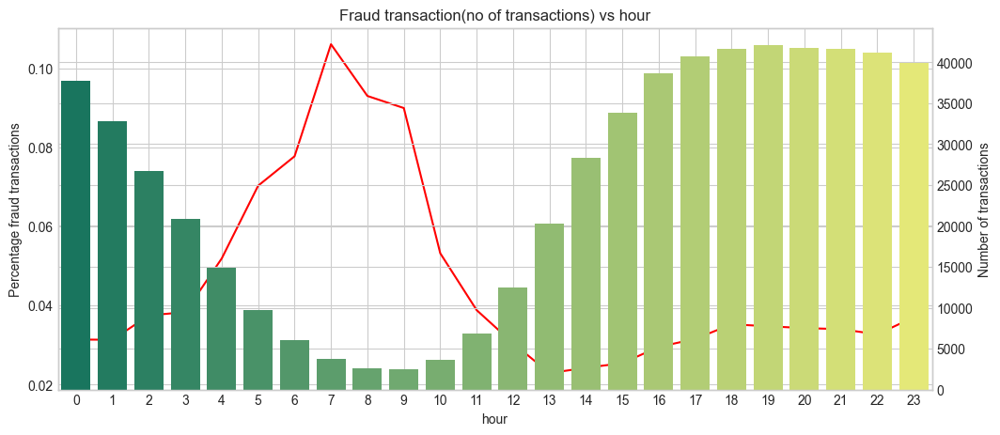

In [ ]:
df_train['hour'] = (df_train['TransactionDT']//(60*60))%24
tmp = df_train[['isFraud','hour']].groupby(by=['hour']).mean().reset_index() \
            .rename(columns={'isFraud':'Percentage fraud transactions'})

tmp_count = df_train[['TransactionID','hour']].groupby(by=['hour']).count().reset_index() \
            .rename(columns={'TransactionID':'Number of transactions'})
tmp = tmp.merge(tmp_count,on=['hour'])




fig, axes = plt.subplots(figsize=(12,5))
axes = sns.lineplot(x=tmp['hour'],y=tmp['Percentage fraud transactions'],color='r')
axes2 = axes.twinx()
axes2 = sns.barplot(x=tmp['hour'],y=tmp['Number of transactions'],palette='summer')
axes.set_title('Fraud transaction(no of transactions) vs hour')
plt.show()



Through our analysis, we pinpointed specific high-risk hours when fraud is more likely to occur. Notably, transaction volumes are significantly lower, approximately **eight times**, during the early morning hours between 6 AM to 9 AM. In contrast, during nighttime, transaction volumes peak, exceeding 40,000 transactions per hour. Based on these findings, we categorized the hours into four distinct groups:

- **High (6 AM - 9 AM):** Signifying the period from 6 AM to 9 AM.
- **Medium (3 AM, 4 AM, 5 AM, 10 AM, 11 AM):** Representing early morning and late morning hours.
- **Low (11 AM - 12 PM, 4 PM - 6 AM, 1 AM - 2 AM):** Encompassing late morning, early afternoon, and late-night hours.
- **Very Low (1 PM, 2 PM, 3 PM):** Indicating the early afternoon hours.

These categories allow for a nuanced understanding of transaction patterns, aiding in targeted fraud prevention measures during specific hours of the day.

#### 1.3.2.3 **Avg. TransactionDT vs. hour**

This code conducts a bivariate analysis focusing on the relationship between the **hour of the day** and **average amount fraud transactions** in the `df_train` dataset.

It calculates the percentage of fraud transactions for each hour and also computes the average transaction amount during each hour.

By visualizing this data through a line plot for fraud percentages and a bar plot for average transaction amounts, the code aims to identify patterns in fraud occurrences concerning different hours of the day and the corresponding transaction values.

Understanding the variation in fraud rates concerning transaction amounts and hours is crucial as it provides insights into potential fraud schemes, enabling more precise identification of suspicious activities and enhancing fraud detection strategies.

**The inclusion of average transaction amounts helps discern if there are specific hourly patterns related to high-value fraudulent transactions, which is valuable information for fraud prevention and mitigation efforts.**

In [ ]:
df_train['TransactionAmt'].describe()

count    590540.000000
mean        135.027176
std         239.162522
min           0.251000
25%          43.321000
50%          68.769000
75%         125.000000
max       31937.391000
Name: TransactionAmt, dtype: float64

In [ ]:
df_train['TransactionAmt'].isnull().sum()

0

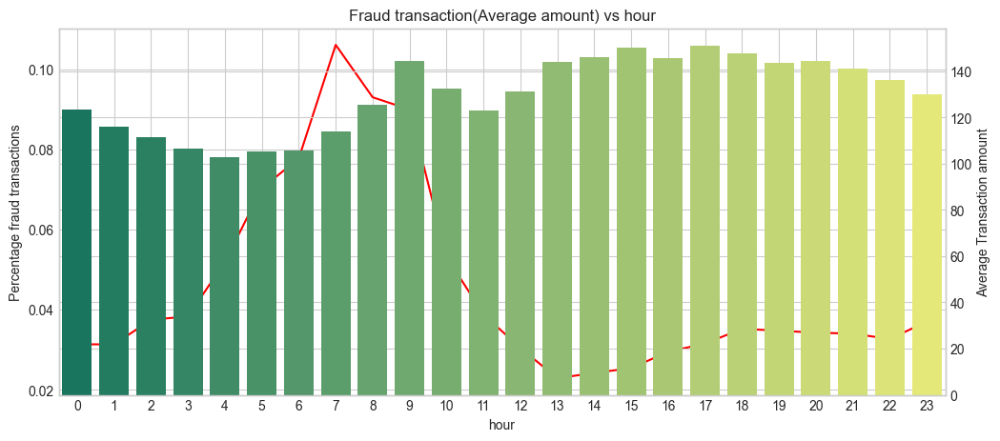

In [ ]:
df_train['hour'] = (df_train['TransactionDT']//(60*60))%24
tmp = df_train[['isFraud','hour']].groupby(by=['hour']).mean().reset_index() \
            .rename(columns={'isFraud':'Percentage fraud transactions'})

tmp_amount = df_train[['TransactionAmt','hour']].groupby(by=['hour']).mean().reset_index() \
            .rename(columns={'TransactionAmt':'Average Transaction amount'})
tmp = tmp.merge(tmp_amount,on=['hour'])




fig, axes = plt.subplots(figsize=(12,5))
axes = sns.lineplot(x=tmp['hour'],y=tmp['Percentage fraud transactions'],color='r')
axes2 = axes.twinx()
axes2 = sns.barplot(x=tmp['hour'],y=tmp['Average Transaction amount'],palette='summer')
axes.set_title('Fraud transaction(Average amount) vs hour')
plt.show()

    This plot reaffirms our earlier findings regarding the connection between fraudulent transactions and the hour of the day. When examining the average fraudulent transaction amounts against hours, it becomes evident that fraud incidents are more prevalent during the morning hours when transaction volumes are lower. As the day progresses, the percentage of fraudulent transactions drops below 4%, but the average transaction amounts increase.
    
    Particularly noteworthy is the consistent rise in fraud occurrences between 6 AM and 9 AM, aligning with a period of escalating average transaction amounts. This observation underscores the significance of monitoring transactions during these early morning hours, where fraud risks are notably heightened despite lower transaction volumes.

### 1.3.3 Desciptive Statistics

### 1.3.3.1 Outliers Analysis  **train vs. test**

Now we compare the outliers in train and test.

We visualized two scatter plots comparing **transaction amounts** against **transaction timestamps** for both the training and test datasets.

In the first plot (left), fraudulent transactions are highlighted in different hues, allowing visual identification of patterns or anomalies in fraud cases.

The second plot (right) shows transaction amounts in the test dataset over time. This analysis aids in descriptive statistics, offering insights into transaction amount distributions, potential trends, and the presence of fraud within the data.

Visualizing these relationships is essential for understanding the dataset's characteristics and identifying potential irregularities or patterns related to fraudulent transactions.

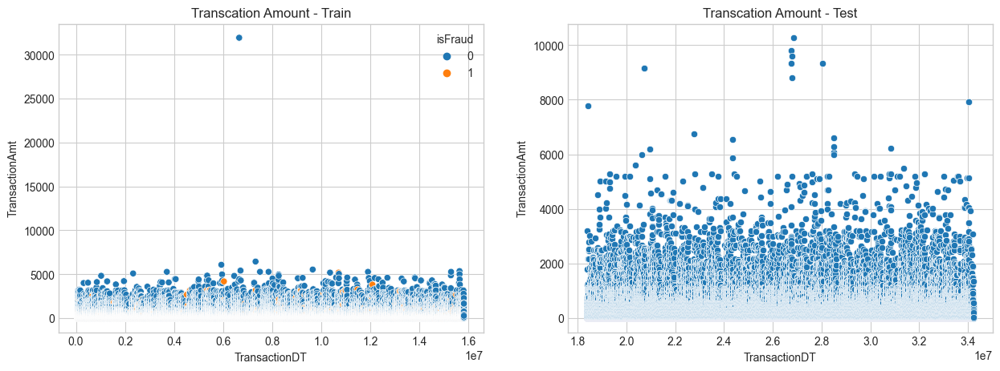

In [ ]:
fig, axes = plt.subplots(1,2,figsize=(15,5))

sns.scatterplot(y=df_train['TransactionAmt'],x=df_train['TransactionDT'],hue=df_train['isFraud'],ax=axes[0])
axes[0].title.set_text('Transcation Amount - Train')

sns.scatterplot(y=df_test['TransactionAmt'],x=df_test['TransactionDT'],ax=axes[1])
axes[1].title.set_text('Transcation Amount - Test')

plt.show()

    In our exploratory analysis, we observed an outlier in the training dataset where the transaction amount exceeded 30,000.
    
    Outliers of this magnitude can significantly impact prediction models, especially distance-based algorithms like logistic regression and k-nearest neighbors (KNN), potentially leading to overfitting.
    
    In tree-based models, these outliers might be treated as noise, disrupting the general patterns. To ensure model stability and prevent overfitting, it was decided to remove transactions with amounts larger than 30,000 from the training set, enhancing the accuracy and reliability of our predictive models.

### 1.3.3.2**TransactionAmt vs. isFraud**


This code conducts a comparative analysis of the logged transaction amounts for **fraud** and **non-fraud** cases in both the training and test datasets.

By applying a **logarithmic transformation**, the data is *normalized and skewed distributions are adjusted*, providing a clearer representation of the transaction amount patterns.

The resulting histograms show the distribution of logged transaction amounts for fraud and non-fraud transactions separately, enabling a better understanding of the differences between these classes.

This analysis aids in descriptive statistics, allowing us to observe and compare the distributions of transaction amounts for fraud and non-fraud cases, which is crucial for feature engineering and building accurate predictive models.

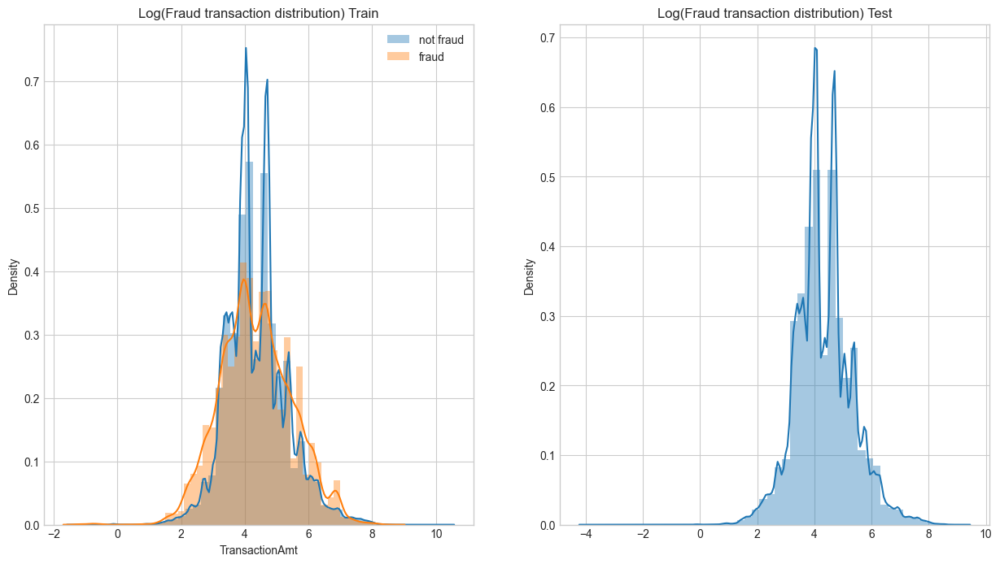

In [ ]:
# TransactionAmt vs isFraud
test_amt = np.log(df_test[['TransactionAmt']])

dff_fraud = df_train[df_train['isFraud'] == 1]
dff_notfraud = df_train[df_train['isFraud'] == 0]

dff_fraud['TransactionAmt'] = np.log(dff_fraud['TransactionAmt'])
dff_notfraud['TransactionAmt'] = np.log(dff_notfraud['TransactionAmt'])


fig,axes = plt.subplots(1,2,figsize=(15,8))
sns.distplot(dff_notfraud['TransactionAmt'],ax=axes[0],label='not fraud')
sns.distplot(dff_fraud['TransactionAmt'],ax=axes[0],label='fraud')
axes[0].title.set_text('Log(Fraud transaction distribution) Train')
axes[0].legend()

sns.distplot(test_amt,ax=axes[1])
axes[1].title.set_text('Log(Fraud transaction distribution) Test')
plt.show()

    Fraudulent transactions exhibit a more pronounced normal distribution, forming a wider bell curve. This characteristic suggests a higher concentration of transactions within specific intervals, indicating distinct patterns in fraudulent activities. This observation is vital for understanding the unique distribution of fraudulent transaction amounts, providing valuable insights for feature selection and model training in our exploratory data analysis and subsequent modeling efforts.


________________________________________________________________________________________________________________________________________

# 2. **Machine Learning Approach**
   2.1 Data Splitting  
   2.2 Feature Selection and Engineering  
   2.3 Validation Set Selection   
   2.4 Model Selection  <br>
      2.3.1 Brief Overview of Selected Models  
      2.3.2 Justification for Model Selection  
   2.5 RandomForestClassifier <br>
      2.5.1 Training Process (params=Default)<br>
      2.5.1.1 Evaluation <br>
      2.5.2 Training Process (with GridSearchCV)<br>
      2.5.2.1 Evaluation  <br>
      2.5.3 Confusion Matrix<br>
   2.6 XGBoostClassifier<br>
      2.6.1 Training Process (with RandomizedSearchCV)<br>
      2.6.2 Metric Evaluation<br>
      2.6.3 Confusion Matrix <br>
   2.7 Correlation Analysis <br>
      2.7.1 Functions <br>
      2.7.2 Analysis on V columns<br>
      2.7.3 Analysis on M column<br>
      2.7.4 Analysis on D column<br>
   2.8 Final Model with Feature Selection Reduce <br>
      2.8.1 Train - Test Split <br>
      2.8.2 Preprocessing <br>
      2.8.3 Training Process on final model <br>
      2.8.4 Metric Evaluation <br>
      2.8.5 Confusion Matrix

## 2.1 Data Splitting

In [ ]:
df_train = pd.read_csv('train_combined.csv')
df_test = pd.read_csv('test_combined.csv')
print(df_train.shape)
print(df_test.shape)

(590540, 434)
(506691, 433)


Now we categorized the columns in the dataset for further machine learning analysis. We grouped the columns into three main categories:

1. **Categorical Columns (`cat_cols`):** These include specific transaction and identity-related attributes, transformed into strings for categorical analysis.
2. **Identifier Columns (`id_cols`):** These columns contain unique transaction identifiers, essential for tracking individual transactions.
3. **Numeric Columns (`numeric_cols`):** This group encompasses various numerical features, primarily representing transaction amounts and other transaction-related parameters.

Defining these column categories is a crucial step in the machine learning process as it helps structure the data, allowing for focused feature engineering and modeling. This categorization simplifies the understanding of the dataset's composition and facilitates targeted analysis, leading to more effective machine learning model development and evaluation.

In [ ]:
# column details
cat_cols = (['ProductCD'] +
            ['card%d' % i for i in range(1, 7)] +
            ['addr1', 'addr2', 'P_emaildomain', 'R_emaildomain'] +
            ['M%d' % i for i in range(1, 10)] +
            ['DeviceType', 'DeviceInfo'] +
            ['id_%d' % i for i in range(12, 39)])


type_map = {c: str for c in cat_cols}
df_train[cat_cols] = df_train[cat_cols].astype(type_map, copy=False)
df_test[cat_cols] = df_test[cat_cols].astype(type_map, copy=False)

######################################################################################

id_cols = ['TransactionID', 'TransactionDT']
target = 'isFraud'

numeric_cols =  [
    'TransactionAmt', 'dist1', 'dist2', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10',
    'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11',
    'D12', 'D13', 'D14', 'D15', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
    'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25',
    'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39',
    'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53',
    'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67',
    'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81',
    'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95',
    'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108',
    'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120',
    'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132',
    'V133', 'V134', 'V135', 'V136', 'V137', 'V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144',
    'V145', 'V146', 'V147', 'V148', 'V149', 'V150', 'V151', 'V152', 'V153', 'V154', 'V155', 'V156',
    'V157', 'V158', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168',
    'V169', 'V170', 'V171', 'V172', 'V173', 'V174', 'V175', 'V176', 'V177', 'V178', 'V179', 'V180',
    'V181', 'V182', 'V183', 'V184', 'V185', 'V186', 'V187', 'V188', 'V189', 'V190', 'V191', 'V192',
    'V193', 'V194', 'V195', 'V196', 'V197', 'V198', 'V199', 'V200', 'V201', 'V202', 'V203', 'V204',
    'V205', 'V206', 'V207', 'V208', 'V209', 'V210', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216',
    'V217', 'V218', 'V219', 'V220', 'V221', 'V222', 'V223', 'V224', 'V225', 'V226', 'V227', 'V228',
    'V229', 'V230', 'V231', 'V232', 'V233', 'V234', 'V235', 'V236', 'V237', 'V238', 'V239', 'V240',
    'V241', 'V242', 'V243', 'V244', 'V245', 'V246', 'V247', 'V248', 'V249', 'V250', 'V251', 'V252',
    'V253', 'V254', 'V255', 'V256', 'V257', 'V258', 'V259', 'V260', 'V261', 'V262', 'V263', 'V264',
    'V265', 'V266', 'V267', 'V268', 'V269', 'V270', 'V271', 'V272', 'V273', 'V274', 'V275', 'V276',
    'V277', 'V278', 'V279', 'V280', 'V281', 'V282', 'V283', 'V284', 'V285', 'V286', 'V287', 'V288',
    'V289', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V296', 'V297', 'V298', 'V299', 'V300',
    'V301', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312',
    'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321', 'V322', 'V323', 'V324',
    'V325', 'V326', 'V327', 'V328', 'V329', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336',
    'V337', 'V338', 'V339', 'id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_07', 'id_08',
    'id_09', 'id_10', 'id_11'
]

**In our machine learning preparation, we split the data into training and testing sets.**

The target variable `isFraud` is separated from the training data, resulting in `X_train` representing the features used for training.

Simultaneously, the testing data (`X_test`) is created as a copy of the original test dataset.
To confirm the dataset dimensions, we print the shapes of both the training and testing sets.

*Additionally, we optimize memory usage by performing garbage collection using `gc.collect()`. This step ensures that our data is well-structured and ready for training our predictive models, facilitating an efficient and accurate machine learning process.*

In [ ]:
## Train and test split¶
y_train_ = df_train['isFraud']
X_train = df_train.drop(columns=['isFraud'])
X_test = df_test.copy()

print(X_train.shape)
print(X_test.shape)
gc.collect()

(590540, 433)
(506691, 433)


786

## 2.2 Features Selection and Engineering

Label encoding is necessary for feature selection and engineering as machine learning algorithms require numerical input. By converting categorical variables into numerical representations, we enable algorithms to process and learn from these features effectively.
This step is crucial for ensuring compatibility with various machine learning models, allowing us to incorporate categorical data into our analysis and improve the predictive power of our models.


This code snippet performs label encoding on all categorical features in the training and testing datasets (`X_train` and `X_test`). Label encoding involves converting categorical values into numerical integers. For each categorical column, the code concatenates the data from both training and test sets, ensuring consistent encoding across the datasets. The `pd.factorize()` function is applied, assigning unique integers to each category while preserving their order. If any encoded values exceed the range of `int16` (from -32,768 to 32,767), a message is printed to indicate that the column needs to be accommodated in a larger datatype.

In [ ]:
# Label encoding all cat features
for col in X_train.columns:
    if col in cat_cols:
        # label encode all cat columns
        dff = pd.concat([X_train[col],X_test[col]])
        dff,_ = pd.factorize(dff,sort=True)
        if dff.max()>32000:
            print(col,'needs int32 datatype')

        X_train[col] = dff[:len(X_train)].astype('int16')
        X_test[col] = dff[len(X_train):].astype('int16')

This code snippet performs feature scaling on the **numeric features** in the training and testing datasets (`X_train` and `X_test`). Feature scaling is crucial because it ensures that all numeric features have a consistent scale, preventing certain features from dominating others due to their larger magnitudes.

For each numeric column (excluding categorical and identifier columns), the code concatenates the data from both datasets and applies min-max scaling. Min-max scaling transforms the values of each feature to a range between 0 and 1 by subtracting the minimum value of the feature and dividing it by the range (difference between maximum and minimum values). This normalization process standardizes the numeric features, making them comparable and ensuring that no single feature disproportionately influences the machine learning models.

Additionally, missing values are filled with a placeholder (-1) to maintain consistency in the dataset. Feature scaling is necessary for various machine learning algorithms, such as support vector machines and k-nearest neighbors, which rely on distance metrics. By performing feature scaling, we enhance the models' performance and contribute to more accurate and reliable predictions during the feature selection and engineering stages.

In [ ]:
# Scaling numeric features
cols = X_train.columns
for col in cols:
    if col not in cat_cols and col not in id_cols:
        # min max scalar
        dff = pd.concat([X_train[col],X_test[col]])
        dff = (dff - dff.min())/(dff.max() - dff.min())
        dff.fillna(-1,inplace=True)

        X_train[col] = dff[:len(X_train)]
        X_test[col] = dff[len(X_train):]

del dff

## 2.3 Validation Set Selection

This code snippet divides the training data into training and validation sets to facilitate model training and evaluation.

It first determines the index range for the training set (`idx_train`) by taking the **first 75%** of the rows from the original training dataset (`X_train`).
The **remaining 25%** of the rows form the validation set (`idx_validation`).

The data for the training set (`x_train`) and its corresponding target variable (`y_train`) are extracted using the indices from `idx_train`. Similarly, the validation set (`x_cv_`) and its corresponding target variable (`y_cv`) are extracted using the indices from `idx_validation`.

Printing the shapes of these sets ensures the correct partitioning of the data. This division is essential for training machine learning models on one subset of the data (training set) and evaluating their performance on another independent subset (validation set). It helps assess the model's generalizability to new, unseen data, allowing us to make informed decisions about the model's performance and potential improvements.

In [ ]:
idx_train = X_train.index[:int(X_train.shape[0]*0.75)]
idx_validation = X_train.index[int(X_train.shape[0]*0.75):]

x_train,y_train = X_train.iloc[idx_train],y_train_.iloc[idx_train]
x_cv_,y_cv = X_train.iloc[idx_validation],y_train_.iloc[idx_validation]


print(x_train.shape)
print(x_cv_.shape)
print(y_train.shape)
print(y_cv.shape)

(442905, 433)
(147635, 433)
(442905,)
(147635,)


## 2.4 Model Selection  

### 2.4.1 Brief Overview of Selected Models  

**Brief Overview Model Selection:**

In tackling our binary classification challenge, we strategically opted for tree-based models, given their aptitude for handling intricate data relationships. Embracing the power of ensemble methods, we commenced our journey with a Bagging ensemble, precisely the Random Forest Classifier, to establish an initial benchmark. Subsequently, our spotlight shifted to the XGBoostClassifier, our ultimate champion in this endeavor.

Our approach for each model family followed a systematic path:

1. **Simple Modeling and Metric Evaluation:** We initiated our exploration with default parameters, allowing us to gauge the raw predictive capabilities of the algorithms. This served as our starting point, providing essential insights into the models' baseline performance.

2. **GridSearchCV Optimization:** Delving deeper, we engaged in GridSearchCV, meticulously fine-tuning hyperparameters to discover the optimal configuration for our models. This exhaustive search technique enabled us to pinpoint the best parameter combinations, enhancing our models' precision and accuracy.

3. **Confusion Matrix Analysis:** With optimized parameters in place, we meticulously examined the confusion matrix. This comprehensive evaluation illuminated the models' proficiency in distinguishing between fraud and non-fraud transactions. Detailed analysis of true positives, true negatives, false positives, and false negatives guided our strategies for further refinement.

Through this iterative process, the XGBoostClassifier emerged as our frontrunner, showcasing unparalleled predictive prowess and robustness. Our meticulous approach to model selection, characterized by systematic refinement and thorough evaluation at each step, empowered us to achieve the utmost efficacy in addressing our binary classification challenge.


### 2.4.2 Justification of Model Selection

**Justification for Model Selection:**

Our decision to usse tree-based models, particularly the **Random Forest Classifier** and the **XGBoostClassifier**, was underpinned by their proven efficacy in handling intricate datasets.

*The ability of tree-based models to capture complex nonlinear relationships within the data fits good with the nuanced patterns inherent in fraud detection tasks.*

The choice of ensembles, such as **RandomForestClassifier**, provided an initial robust framework by aggregating diverse decision trees, amplifying the model's predictive capabilities.

Transitioning to the **XGBoostClassifier**, a gradient boosting algorithm, was motivated by its **optimized predictive performance**. The XGBoost algorithm, renowned for its speed, efficiency, and ability to handle large datasets, outshone other models during evaluation. Its capability to **minimize both bias and variance** made it the ideal candidate for our fraud detection task, *ensuring a balance between accuracy and generalizability*.
Moreover, the ensemble nature of XGBoost empowered us to harness the collective intelligence of multiple weak learners, resulting in a highly accurate and stable predictive model. This careful model selection process was guided by the pursuit of not only accuracy but also robustness and interpretability, aligning our approach with the complex demands of fraud detection in real-world scenarios.

## 2.5 RandomForestClassifier  

### 2.5.1 Training Process (params=Default)
##### 2.5.1.1 Metric Evaluation

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()
model.fit(x_train,y_train)
y_train_pred = model.predict(x_train)
y_test_pred = model.predict(x_cv_)

train_fpr, train_tpr, thresholds = roc_curve(y_train, model.predict_proba(x_train)[:,1])
test_fpr, test_tpr, thresholds = roc_curve(y_cv, model.predict_proba(x_cv_)[:,1])

#Area under ROC curve
print('Area under train roc {}'.format(auc(train_fpr, train_tpr)))
print('Area under test roc {}'.format(auc(test_fpr, test_tpr)))

Area under train roc 0.9999999994737414
Area under test roc 0.8775131041085885


### 2.5.2 Training Process (with GridSearchCV)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
clf = RandomForestClassifier(n_jobs= -1,class_weight='balanced')
no_of_estimators = [5, 10, 50, 100, 120]
maximumdepth = [1, 5, 7, 10, 15, 25, 30]


parameters = {'n_estimators': no_of_estimators ,'max_depth':maximumdepth }
model = RandomizedSearchCV(estimator=clf,  param_distributions=parameters, cv=3, n_iter=6, scoring='roc_auc')
model.fit(x_train,y_train)

RandomizedSearchCV(cv=3,
                   estimator=RandomForestClassifier(class_weight='balanced',
                                                    n_jobs=-1),
                   n_iter=6,
                   param_distributions={'max_depth': [1, 5, 7, 10, 15, 25, 30],
                                        'n_estimators': [5, 10, 50, 100, 120]},
                   scoring='roc_auc')

In [ ]:
model.best_params_

{'n_estimators': 100, 'max_depth': 7}

#### 2.5.2.1 Metric Evaluation

Overall Model Performance: The model appears to be performing well with AUC-ROC scores above **0.8** on both the training and test datasets. This suggests that it has good discriminatory power and can be a valuable tool for the binary classification task at hand.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(max_depth=7,n_estimators=100)
model.fit(x_train,y_train)
y_train_pred = model.predict(x_train)
y_test_pred = model.predict(x_cv_)

train_fpr, train_tpr, thresholds = roc_curve(y_train, model.predict_proba(x_train)[:,1])
test_fpr, test_tpr, thresholds = roc_curve(y_cv, model.predict_proba(x_cv_)[:,1])

#Area under ROC curve
print('Area under train roc {}'.format(auc(train_fpr, train_tpr)))
print('Area under test roc {}'.format(auc(test_fpr, test_tpr)))

Area under train roc 0.859544778919307
Area under test roc 0.8464805307537122


### 2.5.3 Confusion Matrix

This code generates confusion matrices for both the training and validation sets, providing a detailed breakdown of the model's predictions.

Confusion matrices are essential tools for evaluating the performance of a machine learning model, showcasing the number of true positive, true negative, false positive, and false negative predictions. By visualizing these matrices, we gain insights into how well our model distinguishes between fraud and non-fraud transactions. The heatmaps provide a clear overview of the model's accuracy and areas where it might be misclassifying, aiding us in refining our fraud detection system and ensuring its reliability in real-world scenarios.

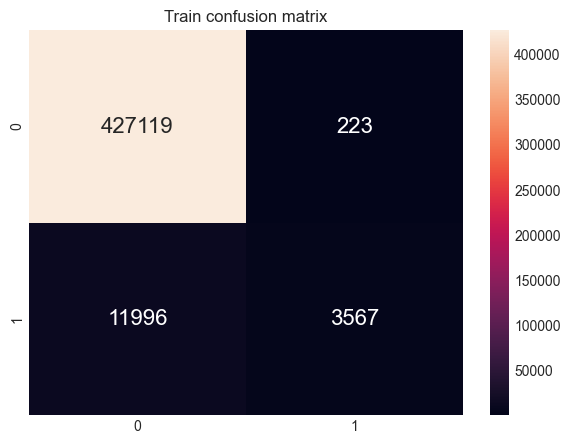

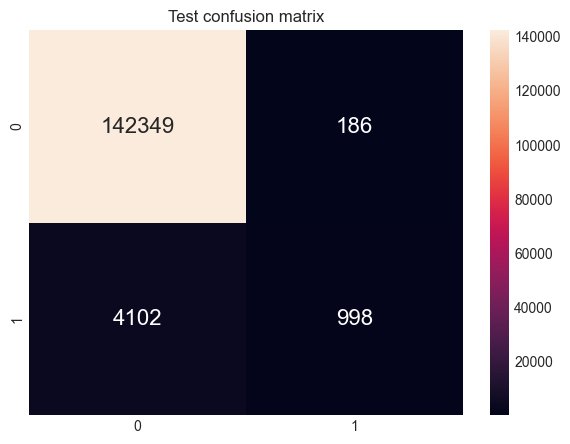

In [ ]:
train_cf = confusion_matrix(y_train,y_train_pred)
plt.figure(figsize=(7,5))
sns.heatmap(train_cf,annot=True,annot_kws={"size": 16},fmt="0")
plt.title('Train confusion matrix')
plt.show()


cv_cf = confusion_matrix(y_cv,y_test_pred)
plt.figure(figsize=(7,5))
sns.heatmap(cv_cf,annot=True,annot_kws={"size": 16},fmt="0")
plt.title('Test confusion matrix')
plt.show()

## 2.6 XGBoostClassifier

### 2.6.1 Training Process (with RandomizedSearchCV)


This code performs hyperparameter tuning for an XGBoostClassifier using RandomizedSearchCV, a technique that systematically explores a predefined set of hyperparameters to find the best combination for the model. It tests different values for parameters such as the number of estimators (trees) in the model, maximum depth of each tree, and the fraction of samples used for training (subsample). The goal is to optimize the model's performance, measured by the area under the ROC curve (ROC AUC), a metric commonly used for binary classification tasks. The RandomizedSearchCV method conducts this search efficiently by randomly selecting combinations of hyperparameters within the specified ranges, cross-validating the results, and ultimately identifying the best-performing configuration for the XGBoostClassifier.

In [ ]:
# xgb_model = xgb.XGBClassifier(objective="binary:logistic", random_state=42)

from sklearn.model_selection import GridSearchCV

params = {'n_estimators':[1000,2000],'max_depth':[3,6,12],'subsample':[0.4,0.8]}



clf = xgb.XGBClassifier(
        missing=-1, learning_rate=0.02,
        eval_metric='auc', tree_method='gpu_hist',colsample_bytree=0.4)



model = RandomizedSearchCV(estimator=clf, param_distributions=params, scoring='roc_auc', verbose=1, cv=3, n_iter=6)
model.fit(x_train,y_train)

Fitting 3 folds for each of 6 candidates, totalling 18 fits


RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=0.4, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='auc',
                                           feature_types=None, gamma=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           max_cat_to_onehot=None,
                                           max_delta_step=None, max_depth=None,
                                           max_leaves=None,
                                           min_child_weight=None, missing=-1,
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=None, ...),
                   n_iter=6,
                   param_distributions={'max_depth': [3, 6, 12],
                                        'n_estimators': [1000, 2000],
                                        'subsample': [0.4, 0.8]},
                   scoring='roc_auc', verbose=1)

In [ ]:
model.best_params_

{'subsample': 0.4, 'n_estimators': 2000, 'max_depth': 6}

### 2.6.2 Metric Evaluation

In [ ]:
model = xgb.XGBClassifier(
        missing=-1, learning_rate=0.02,
        eval_metric='auc', tree_method='gpu_hist',colsample_bytree=0.4,max_depth=6,n_estimators=2000,subsample=0.8)
model.fit(x_train,y_train)
y_train_pred = model.predict(x_train)
y_test_pred = model.predict(x_cv_)

train_fpr, train_tpr, thresholds = roc_curve(y_train, model.predict_proba(x_train)[:,1])
test_fpr, test_tpr, thresholds = roc_curve(y_cv, model.predict_proba(x_cv_)[:,1])

#Area under ROC curve
print('Area under train roc {}'.format(auc(train_fpr, train_tpr)))
print('Area under test roc {}'.format(auc(test_fpr, test_tpr)))

Area under train roc 0.9715493217104472
Area under test roc 0.9114220841527055


### 2.6.3 Confusion Matrix

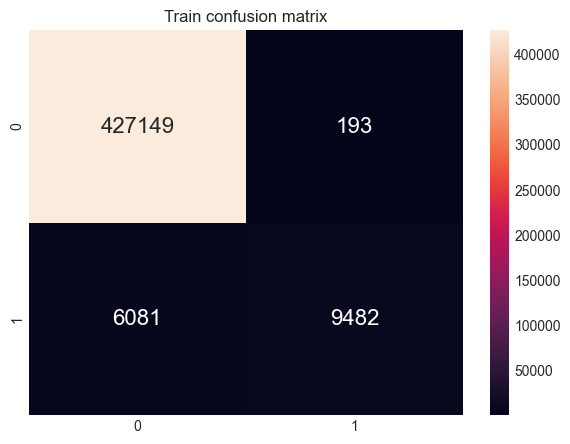

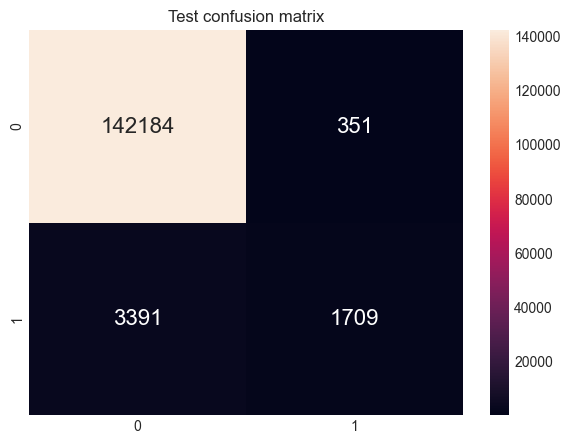

In [ ]:


train_cf = confusion_matrix(y_train,y_train_pred)
plt.figure(figsize=(7,5))
sns.heatmap(train_cf,annot=True,annot_kws={"size": 16},fmt="0")
plt.title('Train confusion matrix')
plt.show()


cv_cf = confusion_matrix(y_cv,y_test_pred)
plt.figure(figsize=(7,5))
sns.heatmap(cv_cf,annot=True,annot_kws={"size": 16},fmt="0")
plt.title('Test confusion matrix')
plt.show()

In [ ]:
# Updated Train data metrics
train_TN, train_FP, train_FN, train_TP = 427149, 193, 6081, 9482

train_accuracy = (train_TN + train_TP) / (train_TN + train_FP + train_FN + train_TP)
train_precision = train_TP / (train_TP + train_FP)
train_recall = train_TP / (train_TP + train_FN)
train_f1_score = (2 * train_precision * train_recall) / (train_precision + train_recall)

# Updated Test data metrics
test_TN, test_FP, test_FN, test_TP = 142184, 351, 3391, 1709

test_accuracy = (test_TN + test_TP) / (test_TN + test_FP + test_FN + test_TP)
test_precision = test_TP / (test_TP + test_FP)
test_recall = test_TP / (test_TP + test_FN)
test_f1_score = (2 * test_precision * test_recall) / (test_precision + test_recall)

train_metrics_updated = {
    'Accuracy': train_accuracy,
    'Precision': train_precision,
    'Recall': train_recall,
    'F1-Score': train_f1_score
}

test_metrics_updated = {
    'Accuracy': test_accuracy,
    'Precision': test_precision,
    'Recall': test_recall,
    'F1-Score': test_f1_score
}

train_metrics_updated, test_metrics_updated

({'Accuracy': 0.9858344340208397,
  'Precision': 0.9800516795865634,
  'Recall': 0.6092655657649554,
  'F1-Score': 0.7514066090815438},
 {'Accuracy': 0.9746537067768483,
  'Precision': 0.829611650485437,
  'Recall': 0.33509803921568626,
  'F1-Score': 0.47737430167597766})

Based on the updated values, here are the recalculated metrics:

Training Data:

Accuracy: 98.58%
Precision: 98.01%
Recall: 60.93%
F1-Score: 75.14%
Test Data:

Accuracy: 97.47%
Precision: 82.96%
Recall: 33.51%
F1-Score: 47.74%
Interpretation:

Accuracy: The accuracy for both sets is high, indicating that the model is generally correct in its predictions.

Precision: The precision for the training data is excellent at 98.01%, meaning that out of all the transactions the model flagged as fraudulent, 98.01% actually were fraudulent. The precision for the test data is also good at 82.96%.

Recall (Sensitivity): Recall is especially important in fraud detection. For the training data, the recall is 60.93%, meaning the model identified 60.93% of all the fraudulent transactions. However, for the test data, the recall is much lower at 33.51%, indicating that the model missed a significant portion of the actual fraudulent transactions.

F1-Score: The F1-Score balances precision and recall. The F1-Score for the training data is 75.14% and for the test data, it's 47.74%.

    The model demonstrates strong performance with high accuracy and precision in both training and test datasets, accurately identifying fraudulent transactions. However, its ability to recall fraudulent cases is suboptimal, particularly in the test data, where it misses a significant portion of actual frauds. The F1-scores highlight the balance between precision and recall, with the training data showing better overall performance compared to the test data.

## 2.7 Correlation Analysis

In our machine learning analysis, we have adopted a systematic approach to handle the large volume of columns and rows in our dataset. We are processing the data in stages, beginning with the V columns, followed by the M columns, and finally, the D columns.

This step-by-step methodology allows us to effectively utilize functions such as `reduce_groups` and `coorelation_analysis` for variable selection and correlation analysis within each column family.

By breaking down the process into manageable steps, we ensure a thorough exploration of the data, enabling us to make informed decisions regarding feature selection and enhancing the overall robustness of our machine learning model.

In [ ]:
def top_missing_cols(df,n=10,thresh=80):
    """
    returns missing columns in dataframe with missing values percent > thresh
    if n=None. It will gave whole dataframe with missing values percent > thresh
    """

    dff = (df.isnull().sum()/df.shape[0])*100
    dff = dff.reset_index()
    dff.columns = ['col','missing_percent']
    dff = dff.sort_values(by=['missing_percent'],ascending=False).reset_index(drop=True)
    print(f'There are {df.isnull().any().sum()} columns in this dataset with missing values.')
    print(f'There are {dff[dff["missing_percent"] > thresh].shape[0]} columns with missing percent values than {thresh}%')
    if n:
        return dff.head(n)
    else:
        return dff

In [ ]:
df_train = pd.read_csv('train_combined.csv')
df_test = pd.read_csv('test_combined.csv')
print(df_train.shape)
print(df_test.shape)

(590540, 434)
(506691, 433)


In [ ]:
df_missing = top_missing_cols(df_train,n=None,thresh=50)
# Taking all column with missing percen > 50
missing_cols = df_missing['col']

There are 414 columns in this dataset with missing values.
There are 214 columns with missing percent values than 50%


This code snippet organizes the columns in the training dataset (`df_train`) based on the count of missing values. It iterates through the columns with missing values (`missing_cols`), counts the number of null values for each column, and groups the columns according to their respective missing value counts. The output displays these groups, showing the count of missing values, the percentage of missing values relative to the total dataset size, and the names of the columns within each group. This information is valuable for understanding the data quality and deciding how to handle missing values in the context of your machine learning analysis, providing insights for data preprocessing strategies in your ML report.

In [ ]:
# we will take all columns and group them based on missing percentage
nan_dict = {}
for col in missing_cols:
    count = df_train[col].isnull().sum()
    try:
        nan_dict[count].append(col)
    except:
        nan_dict[count] = [col]

for k,v in nan_dict.items():
    print(f'#####' * 4)
    print(f'NAN count = {k} percent: {(int(k)/df_train.shape[0])*100} %')
    print(v)

####################
NAN count = 585793 percent: 99.19615944728554 %
['id_24']
####################
NAN count = 585408 percent: 99.13096487960172 %
['id_25']
####################
NAN count = 585385 percent: 99.12707013919464 %
['id_07', 'id_08']
####################
NAN count = 585381 percent: 99.12639279303687 %
['id_21']
####################
NAN count = 585377 percent: 99.12571544687913 %
['id_26']
####################
NAN count = 585371 percent: 99.1246994276425 %
['id_27', 'id_23', 'id_22']
####################
NAN count = 552913 percent: 93.62837403054831 %
['dist2']
####################
NAN count = 551623 percent: 93.40992989467267 %
['D7']
####################
NAN count = 545427 percent: 92.36072069631184 %
['id_18']
####################
NAN count = 528588 percent: 89.50926270870728 %
['D13']
####################
NAN count = 528353 percent: 89.46946862193924 %
['D14']
####################
NAN count = 525823 percent: 89.04104717715988 %
['D12']
####################
NAN count = 52

#### 2.7.1 Functions
This function, `coorelation_analysis`, generates a heatmap to visualize the pairwise correlations between selected columns (`cols`) from the training dataset. The heatmap provides a graphical representation of how strongly these variables are correlated; positive correlations are indicated in one color (e.g., blue), while negative correlations are represented in another color (e.g., red). Understanding these correlations is crucial for Variable Importance and Selection in machine learning, as highly correlated variables might provide redundant information to the model. Identifying and potentially excluding such correlated variables can improve model performance, reduce overfitting, and enhance the interpretability of the selected features.

In [ ]:
def coorelation_analysis(cols,title='Coorelation Analysis',size=(12,12)):
    cols = sorted(cols)
    fig,axes = plt.subplots(1,1,figsize=size)
    df_corr = df_train[cols].corr()
    sns.heatmap(df_corr,annot=True,cmap='RdBu_r')
    axes.title.set_text(title)
    plt.show()


This `reduce_groups` function aims to identify and retain the most informative column from a group of related attributes. It iterates through each group of attributes (`grps`) and selects the column with the highest number of unique values, indicating it contains the most diverse information within the group. This function is crucial for Variable Importance and Selection because it helps in simplifying the dataset by retaining the most valuable attributes from correlated or related groups. By keeping the most informative columns and removing redundant or less diverse ones, the function aids in improving the efficiency and accuracy of machine learning models, ensuring that the selected features carry distinct and meaningful information for the predictive task at hand.

In [ ]:
def reduce_groups(grps):
    '''
    determining column that have more unique values among a group of atttributes
    '''
    use = []
    for col in grps:
        max_unique = 0
        max_index = 0
        for i,c in enumerate(col):
            n = df_train[c].nunique()
            if n > max_unique:
                max_unique = n
                max_index = i
        use.append(col[max_index])
    return use

### 2.7.2 Analysis on **V Columns**

#### 2.7.2.1 **on V1-V11**

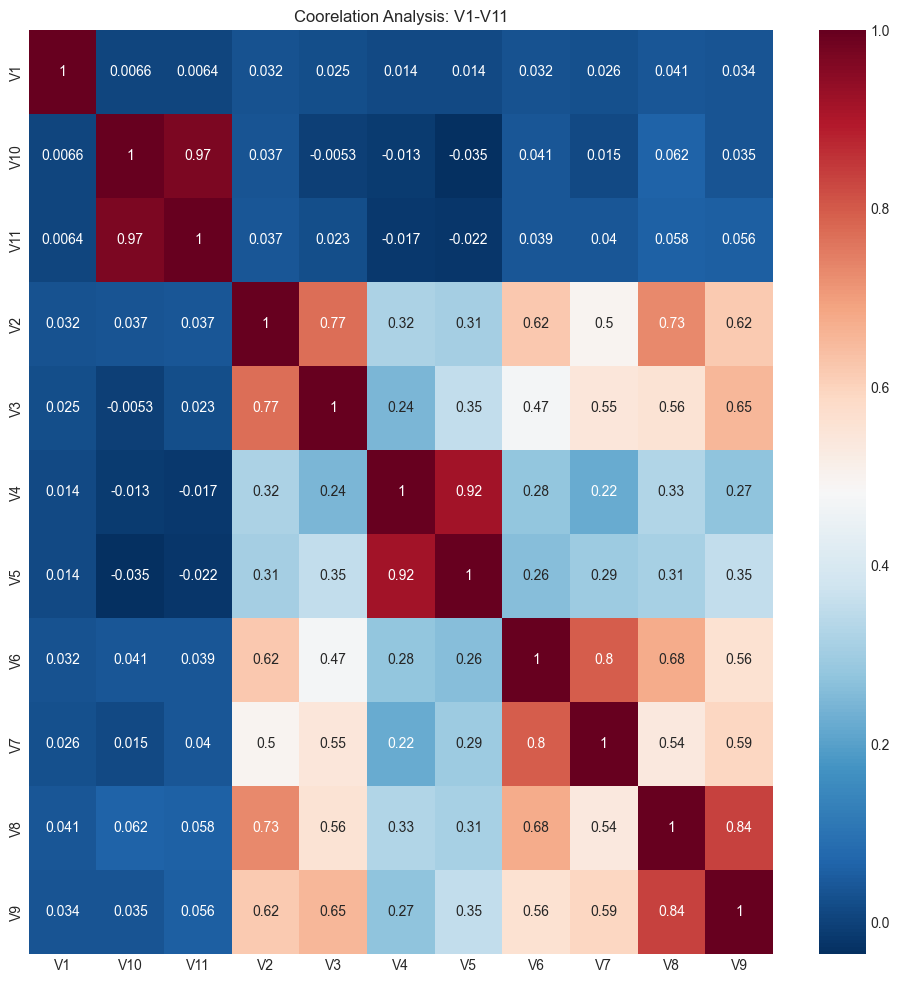

In [ ]:
cols = ['V3', 'V9', 'V5', 'V11', 'V10', 'V8', 'V7', 'V6', 'V4', 'V2', 'V1']
coorelation_analysis(cols,title='Coorelation Analysis: V1-V11')

In [ ]:
pairs = [['V1'],['V2','V3'],['V4','V5'],['V6','V7'],['V8','V9'],['V10','V11']]
reduce_groups(pairs)

['V1', 'V3', 'V4', 'V6', 'V8', 'V11']

#### 2.7.2.2 **V12-34**

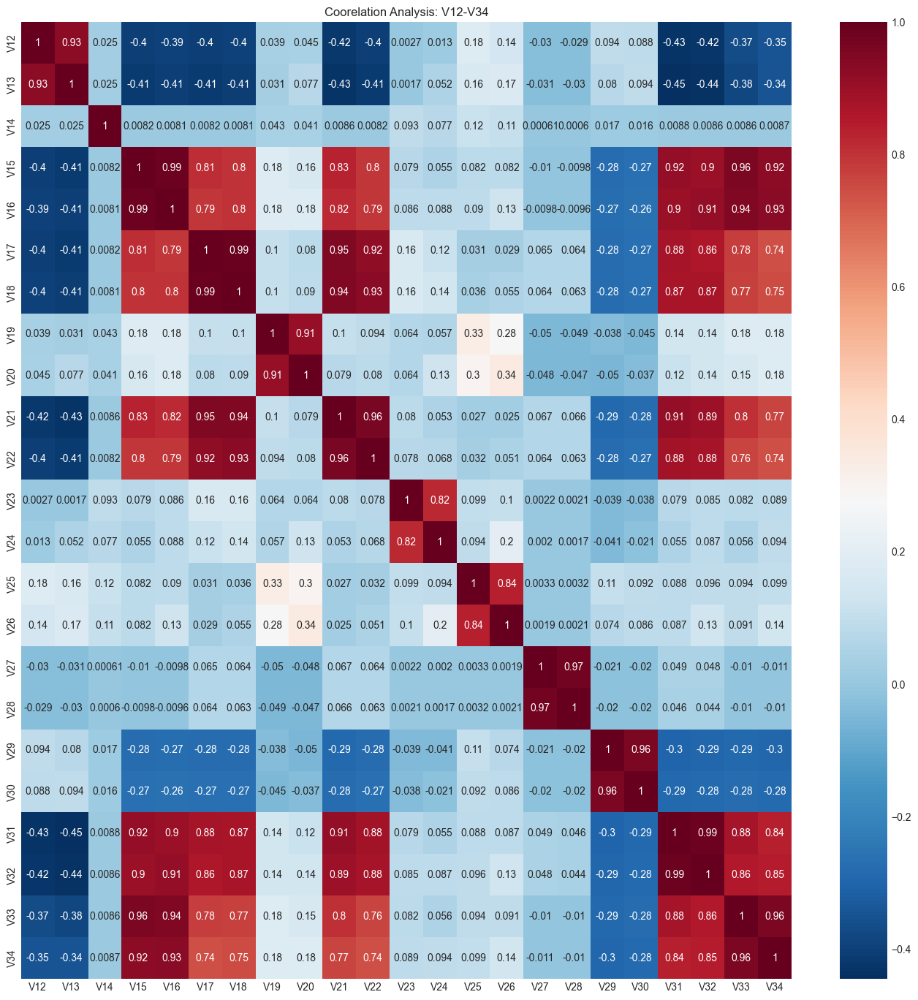

In [ ]:
cols = ['V21', 'V22', 'V23', 'V34', 'V33', 'V32','V31', 'V30', 'V29', 'V28',
         'V27', 'V25', 'V24', 'V26', 'V16', 'V15',
        'V20', 'V14', 'V19', 'V18', 'V17', 'V12', 'V13']

coorelation_analysis(cols,title='Coorelation Analysis: V12-V34',size=(17,17))

In [ ]:
pairs = [['V12','V13'],['V14'],['V15','V16','V17','V18','V21','V22','V31','V32','V33','V34'],['V19','V20'],
         ['V23','V24'],['V25','V26'],['V27','V28'],['V29','V30']]

red_cols = reduce_groups(pairs)
red_cols

['V13', 'V14', 'V17', 'V20', 'V23', 'V26', 'V27', 'V30']

#### 2.7.2.3 ***V35-52**

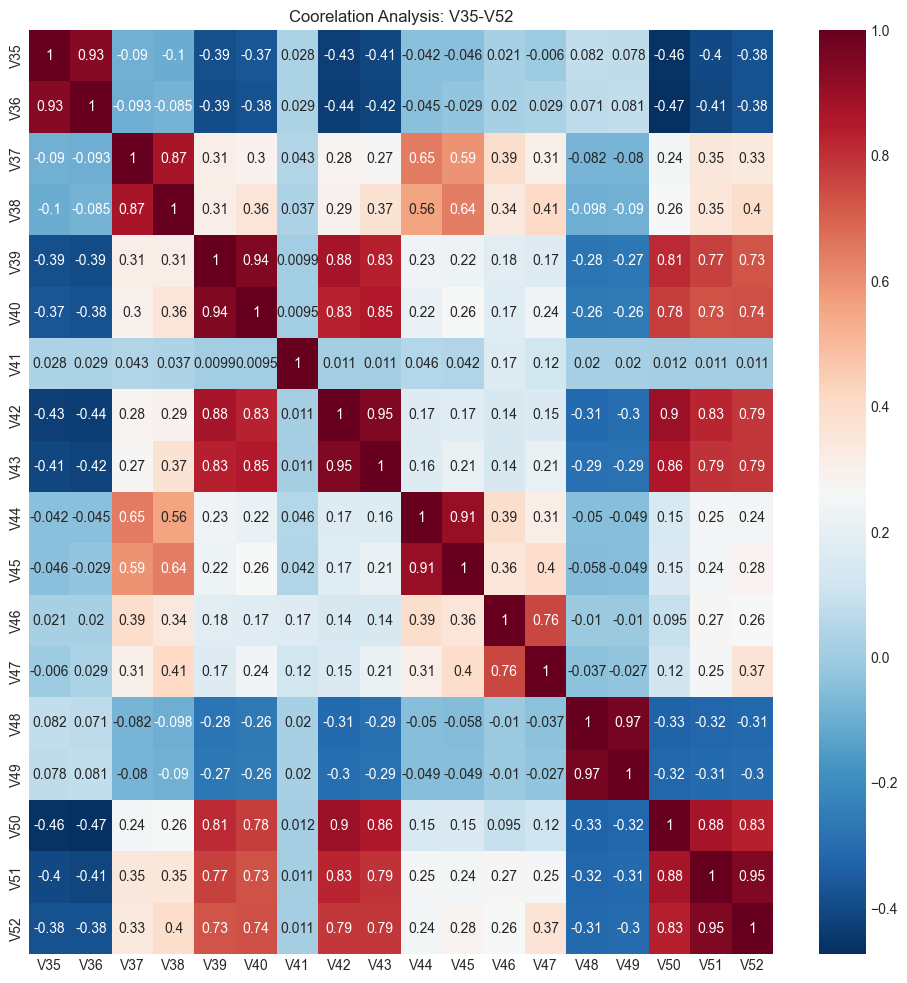

In [ ]:
cols = ['V35', 'V40', 'V41', 'V39', 'V38', 'V51', 'V37', 'V52', 'V36', 'V50', 'V48', 'V42',
 'V43', 'V44', 'V46', 'V47', 'V45', 'V49']


coorelation_analysis(cols,title='Coorelation Analysis: V35-V52',size=(12,12))

In [ ]:
pairs = [['V35','V36'],['V37','V38'],['V39','V40','V42','V43','V50','V51','V52'],['V41'],
         ['V44','V45'],['V46','V47'],['V48','V49']]

red_cols = reduce_groups(pairs)
red_cols

['V36', 'V37', 'V40', 'V41', 'V44', 'V47', 'V48']

#### 2.7.2.4 **V52-74**

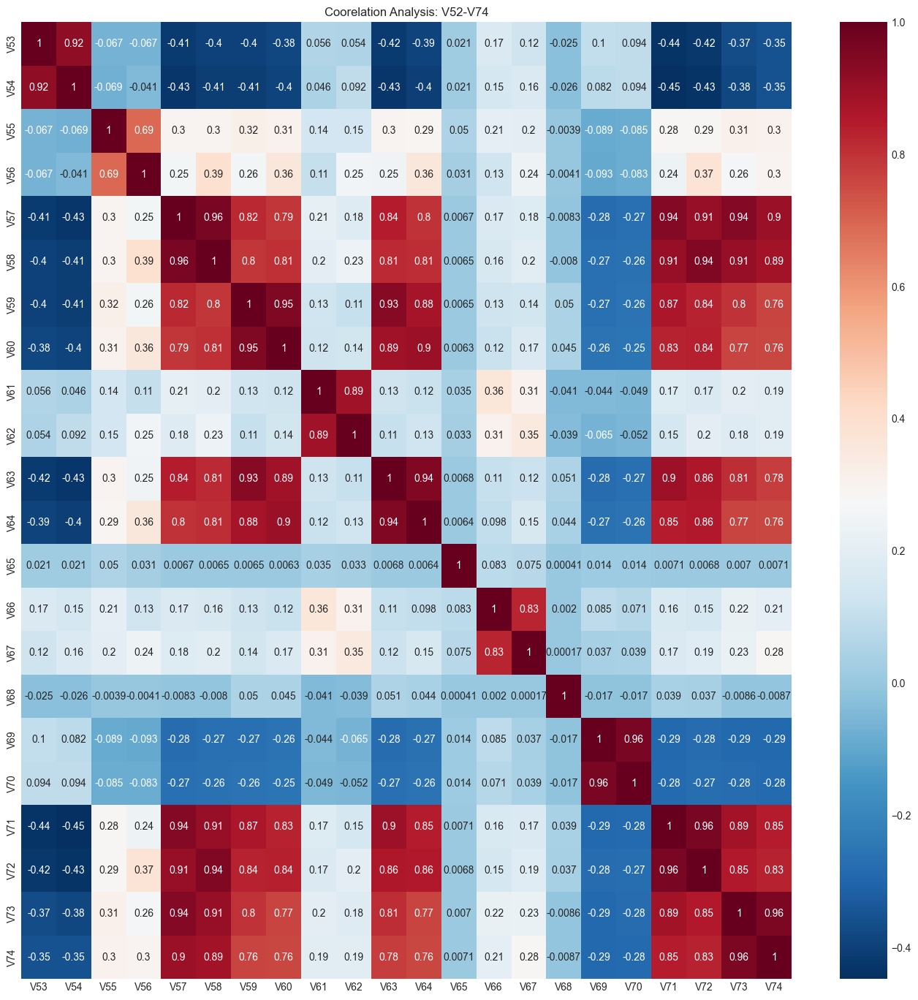

In [ ]:
cols = ['V72', 'V74', 'V73', 'V71', 'V65', 'V68', 'V58', 'V70', 'V53',
 'V54', 'V55', 'V56', 'V57', 'V59', 'V67', 'V60', 'V61',
 'V62', 'V63', 'V64', 'V66', 'V69']

coorelation_analysis(cols,title='Coorelation Analysis: V52-V74',size=(17,17))

In [ ]:
pairs = [['V53','V54'],['V55'],['V56'],['V57', 'V58', 'V59', 'V60', 'V63', 'V64', 'V71', 'V72', 'V73', 'V74'],['V61','V62'],
 ['V65'],['V66','V67'],['V68'],['V69','V70']]



red_cols = reduce_groups(pairs)
red_cols


['V54', 'V55', 'V56', 'V59', 'V62', 'V65', 'V67', 'V68', 'V70']

#### 2.7.2.5 **V75-94**

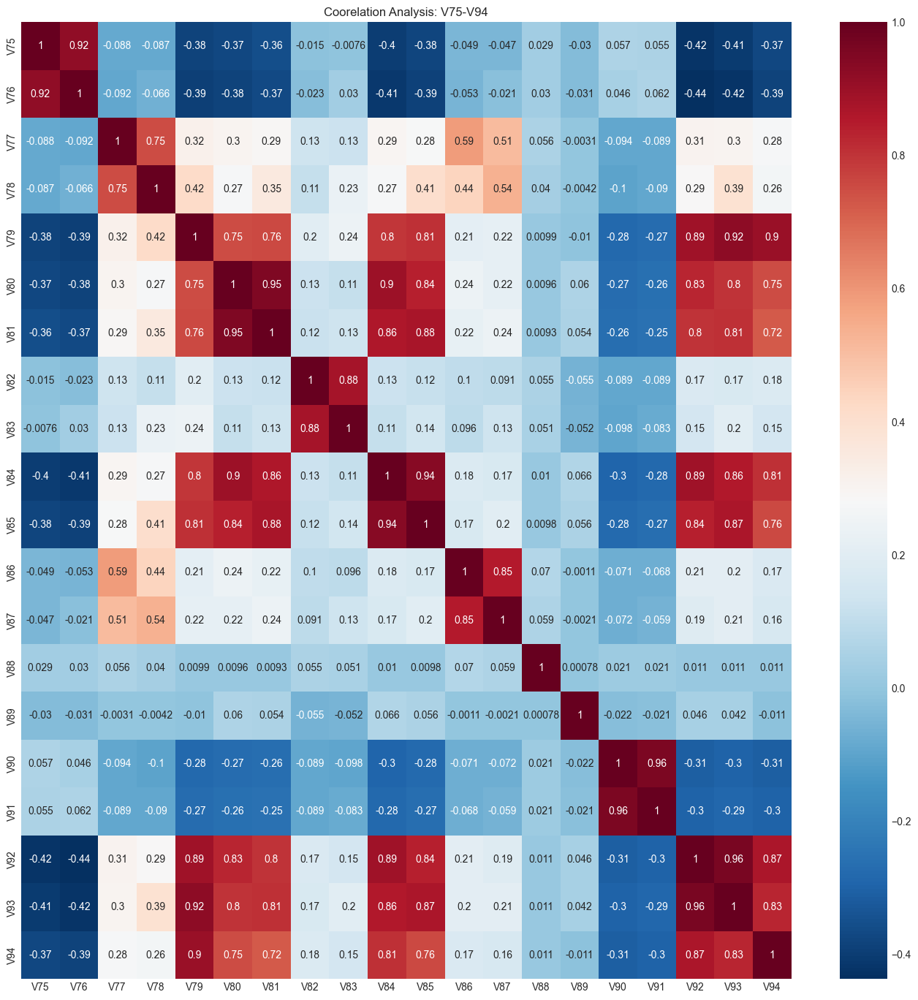

In [ ]:
cols = ['V80', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V86', 'V79',
 'V85', 'V75', 'V84', 'V77', 'V83', 'V78', 'V82', 'V81', 'V76']

coorelation_analysis(cols,title='Coorelation Analysis: V75-V94',size=(17,17))

In [ ]:
pairs = [['V75','V76'],['V77','V78'],['V79','V80','V81','V84','V85','V92','V93','V94'],['V82','V83'],['V86','V87'],
         ['V88'],['V89'],['V90','V91']]


red_cols = reduce_groups(pairs)
red_cols

['V76', 'V78', 'V80', 'V82', 'V86', 'V88', 'V89', 'V91']

#### 2.7.2.6 **V95-137**

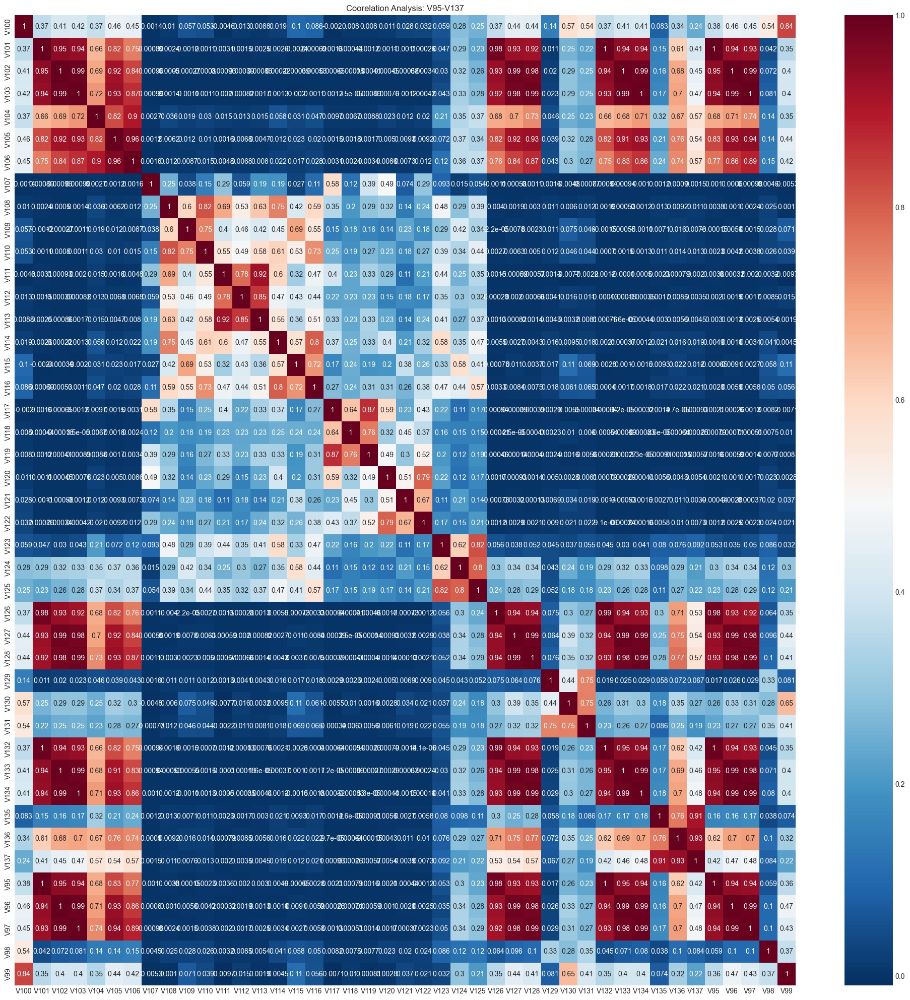

In [ ]:

cols = ['V104', 'V109', 'V110', 'V111', 'V112', 'V106', 'V105', 'V102', 'V103', 'V96', 'V101', 'V100',
        'V99', 'V98', 'V97', 'V95', 'V135', 'V134', 'V107', 'V133', 'V132', 'V131', 'V130', 'V129',
        'V128', 'V127', 'V126', 'V125', 'V124', 'V123', 'V122', 'V121',
        'V120', 'V119', 'V118', 'V117', 'V116', 'V115', 'V114', 'V113', 'V136', 'V137', 'V108']

coorelation_analysis(cols,title='Coorelation Analysis: V95-V137',size=(25,25))


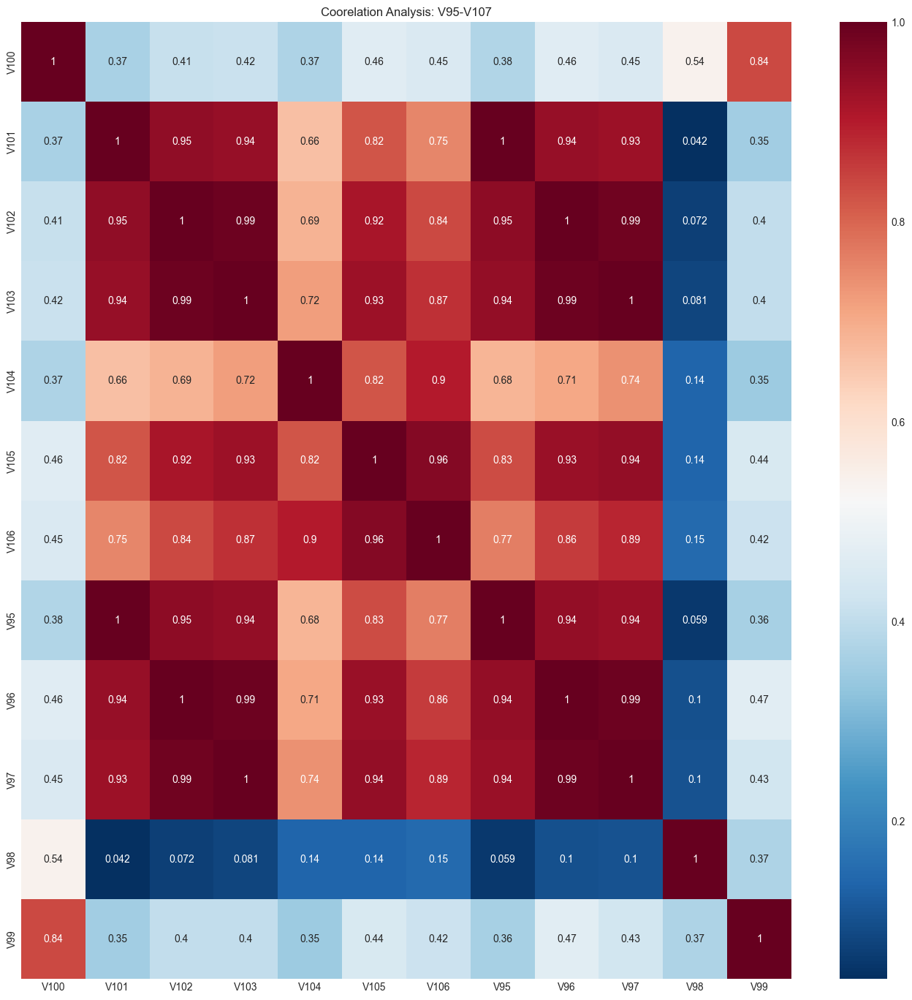

In [ ]:
cols = ['V'+str(x) for x in range(95,107)]

coorelation_analysis(cols,title='Coorelation Analysis: V95-V107',size=(17,17))

In [ ]:
pairs = [['V99','V100'],['V98'],['V104'],['V95','V96','V97','V101','V102','V103','V105','V106']]

red_cols = reduce_groups(pairs)
red_cols

['V99', 'V98', 'V104', 'V96']

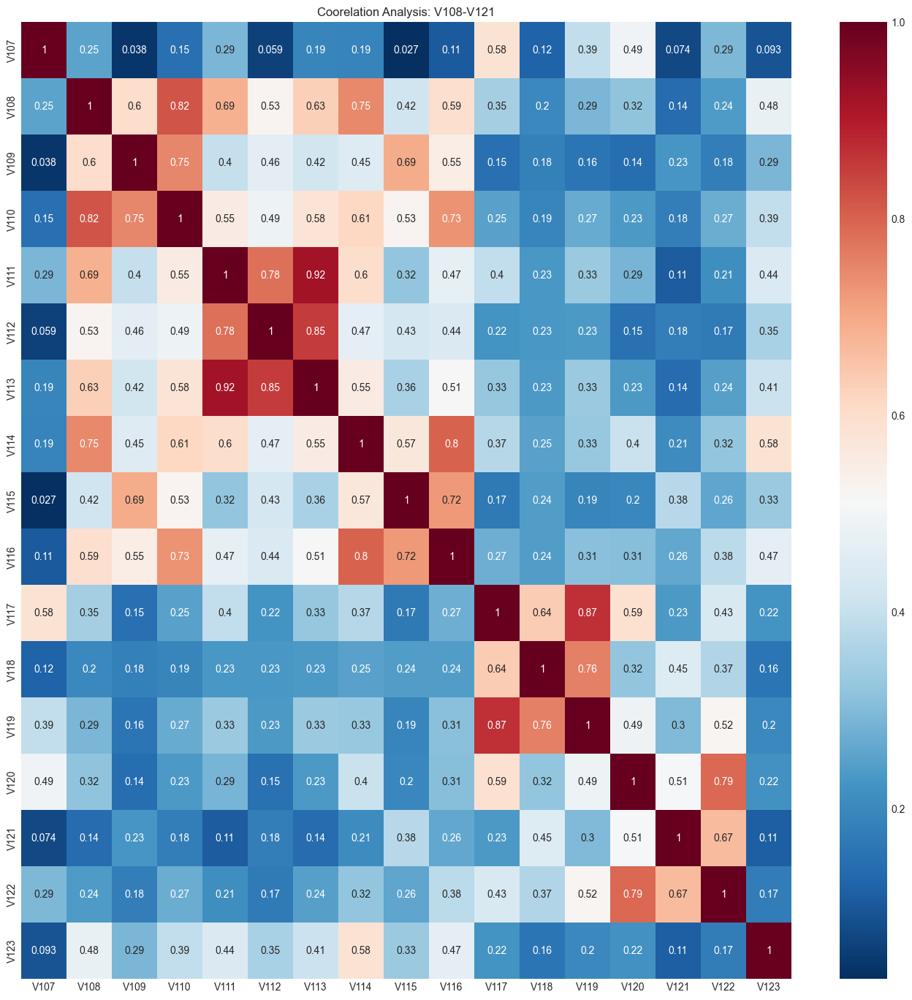

In [ ]:
cols = ['V'+str(x) for x in range(107,124)]

coorelation_analysis(cols,title='Coorelation Analysis: V108-V121',size=(17,17))

In [ ]:

pairs = [['V107'],['V108','V109','V110','V114'],['V111','V112','V113'],['V115','V116'],['V117','V118','V119'],['V120','V122'],['V121'],['V123']]

red_cols = reduce_groups(pairs)
red_cols

['V107', 'V108', 'V111', 'V115', 'V117', 'V120', 'V121', 'V123']

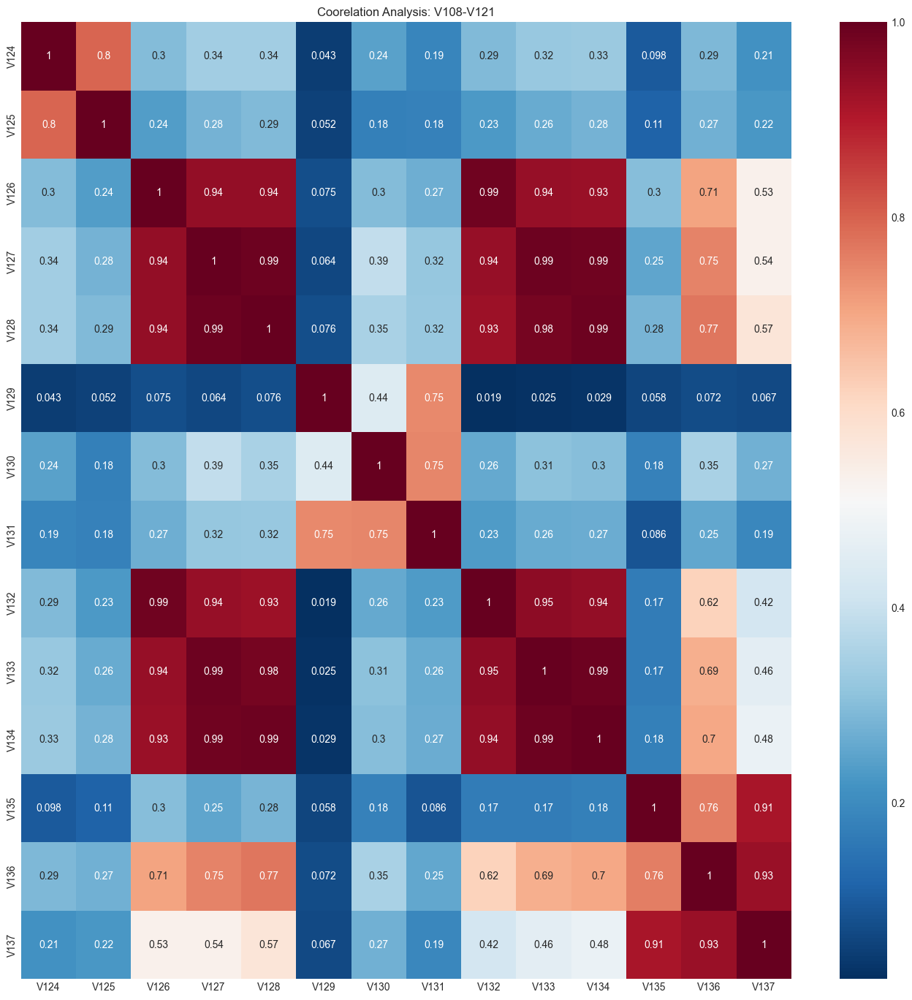

In [ ]:
cols = ['V'+str(x) for x in range(124,138)]
coorelation_analysis(cols,title='Coorelation Analysis: V108-V121',size=(17,17))

In [ ]:
pairs = [['V124','V125'],['V126','V127','V128','V132','V133','V134'],['V129'],['V130','V131'],['V135','V136','V137']]

red_cols = reduce_groups(pairs)
red_cols

['V124', 'V127', 'V129', 'V130', 'V136']

#### 2.7.2.7 **V138-163**

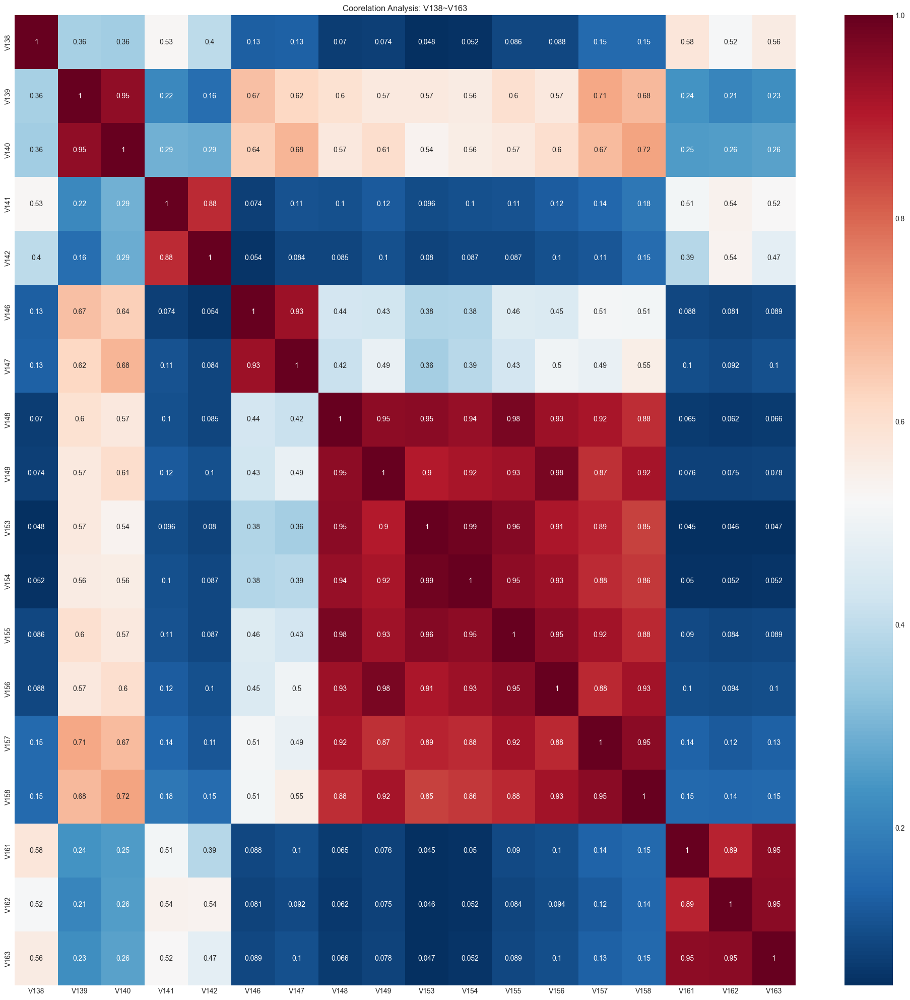

In [ ]:
cols = ['V142', 'V158', 'V140', 'V162', 'V141', 'V161', 'V157', 'V146', 'V156', 'V155', 'V154',
        'V153', 'V149', 'V147', 'V148', 'V163', 'V139', 'V138']

coorelation_analysis(cols,title='Coorelation Analysis: V138~V163',size=(25,25))

In [ ]:
pairs = [['V138'],['V139','V140'],['V141','V142'],['V146','V147'],['V148','V149','V153','V154','V156','V157','V158'],['V161','V162','V163']]

red_cols = reduce_groups(pairs)
red_cols

['V138', 'V139', 'V142', 'V147', 'V156', 'V162']

#### 2.7.2.8 **V143-166**

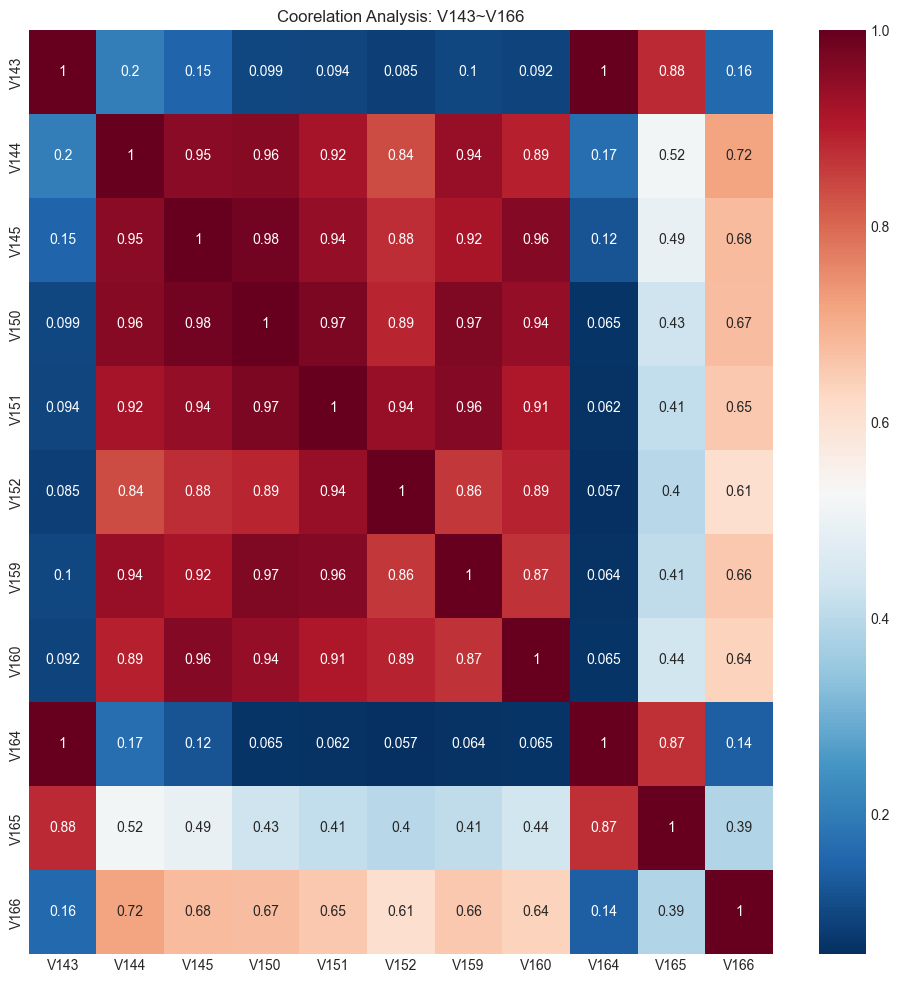

In [ ]:
cols = ['V160', 'V151', 'V152', 'V145', 'V144', 'V143', 'V159', 'V164', 'V165', 'V166', 'V150']

coorelation_analysis(cols,title='Coorelation Analysis: V143~V166',size=(12,12))

In [ ]:
pairs = [['V143','V164','V165'],['V144','V145','V150','V151','V152','V159','V160'],['V166']]

red_cols = reduce_groups(pairs)
red_cols

['V165', 'V160', 'V166']

#### 2.7.2.9 **V167-216**

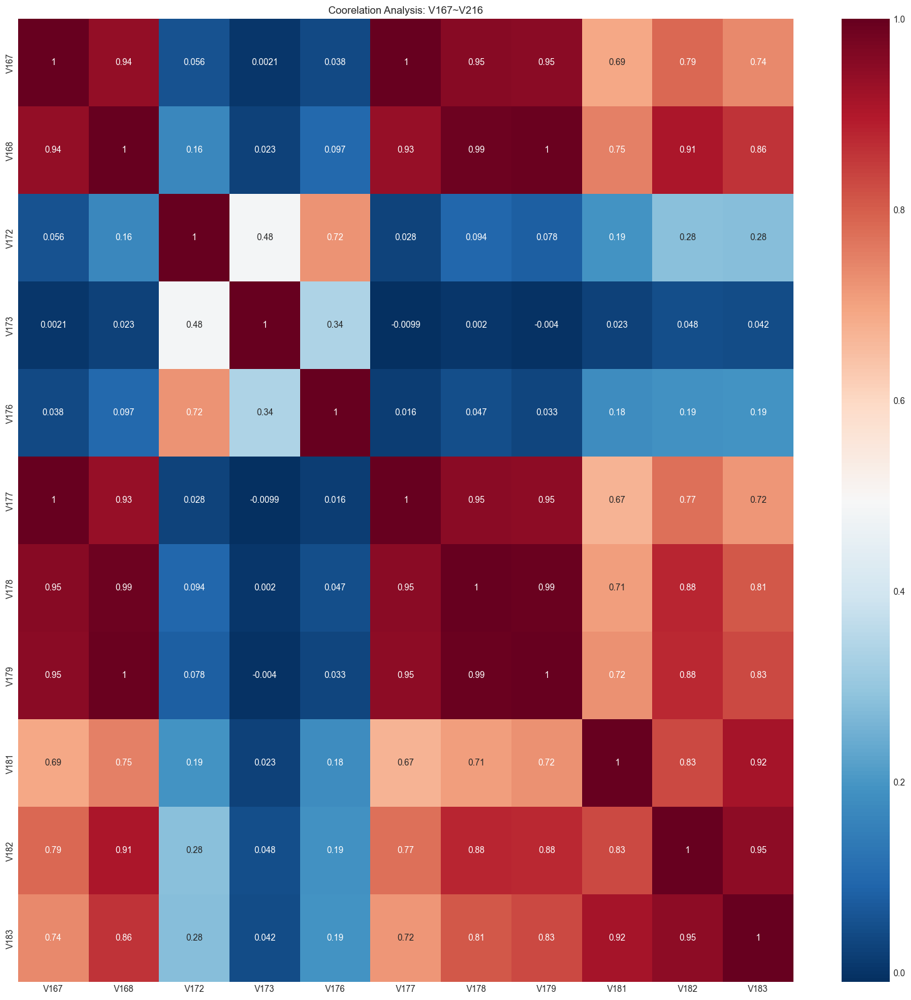

In [ ]:
cols = ['V167', 'V168','V172','V173','V176','V177','V178','V179','V181','V182','V183']

coorelation_analysis(cols,title='Coorelation Analysis: V167~V216',size=(20,20))

In [ ]:
pairs = [['V167','V168','V177','V178','V179'],['V172','V176'],['V173'],['V181','V182','V183']]
reduce_groups(pairs)

['V178', 'V176', 'V173', 'V182']

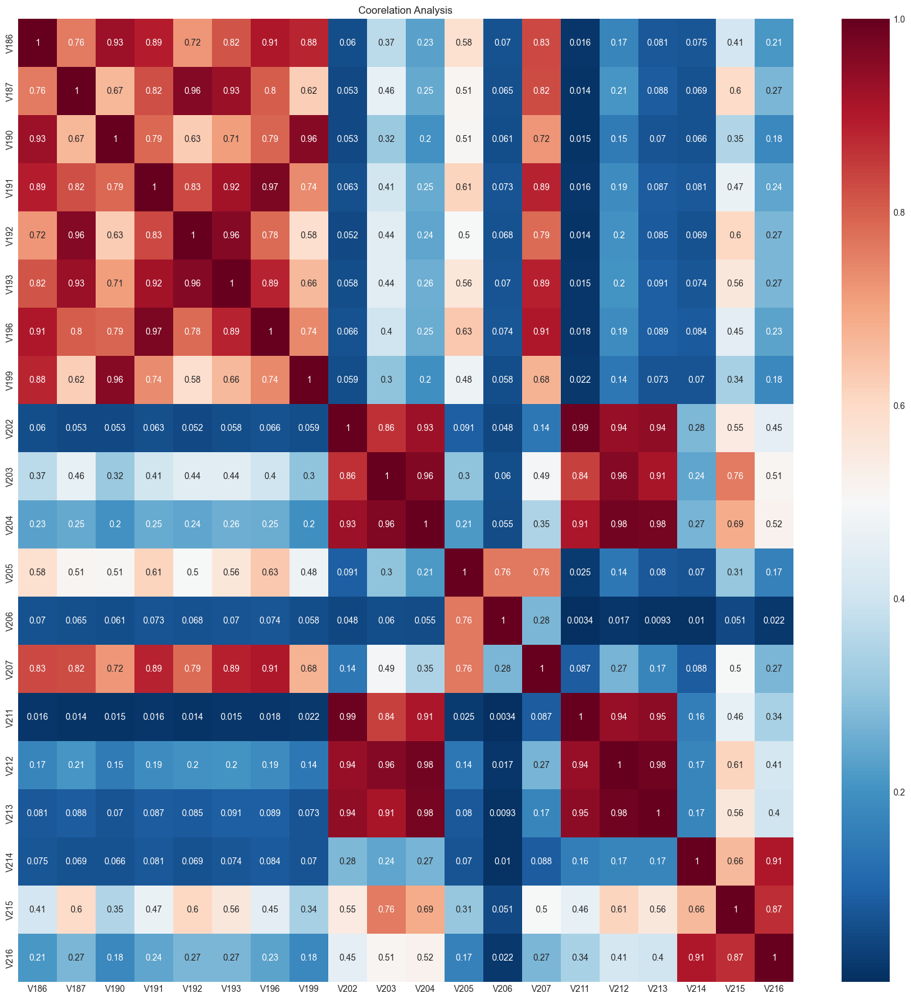

In [ ]:
cols = ['V186','V187','V190','V191','V192','V193','V196','V199','V202','V203','V204','V211','V212','V213','V205','V206','V207','V214','V215','V216']

coorelation_analysis(cols,title='Coorelation Analysis',size=(20,20))

In [ ]:
pairs = [['V186','V187','V190','V191','V192','V193','V196','V199'],['V202','V203','V204','V211','V212','V213'],['V205','V206'],['V207'],['V214','V215','V216']]
reduce_groups(pairs)

['V187', 'V203', 'V205', 'V207', 'V215']

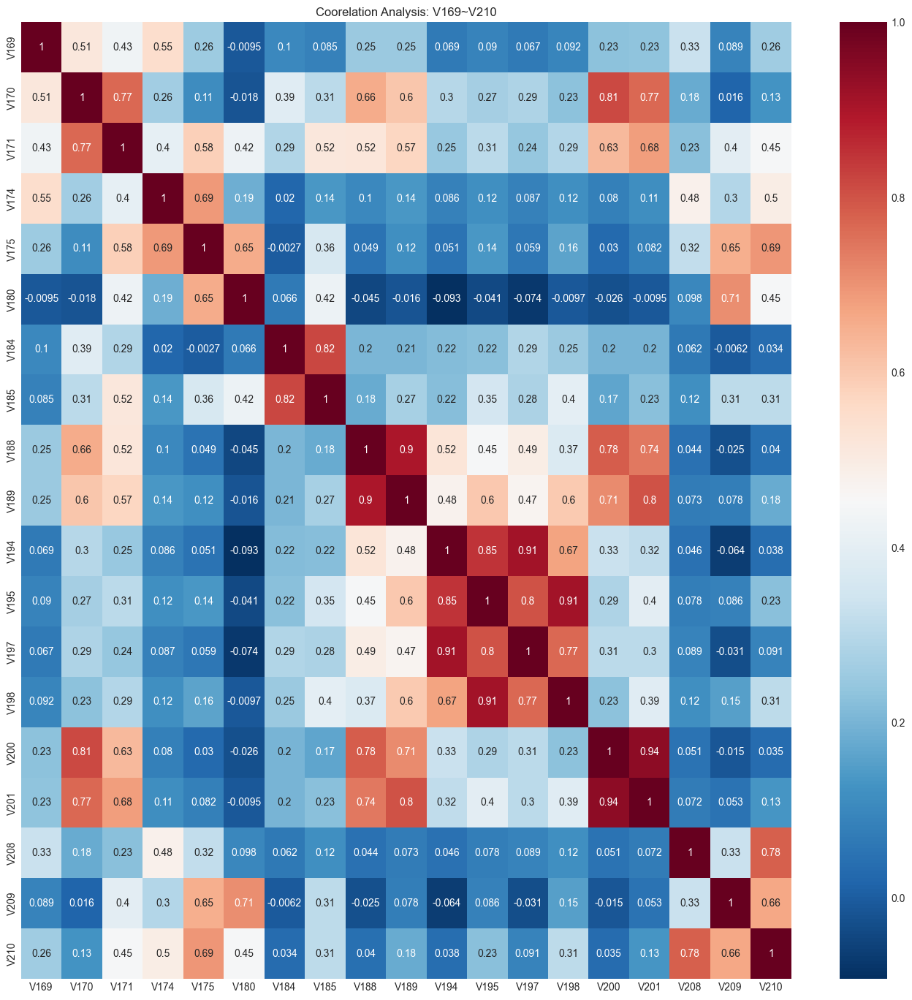

In [ ]:
cols = ['V194', 'V200', 'V189', 'V188', 'V185', 'V184', 'V180', 'V175', 'V174', 'V171',
 'V170', 'V169', 'V195', 'V201', 'V197', 'V198', 'V209', 'V208', 'V210']


coorelation_analysis(cols,title='Coorelation Analysis: V169~V210',size=(17,17))

In [ ]:
pairs = [['V169'],['V170','V171','V200','V201'],['V174','V175'],['V180'],['V184','V185'],['V188','V189'],['V194','V195','V197','V198'],['V208','V210'],
         ['V209']]

red_cols = reduce_groups(pairs)
red_cols

['V169', 'V171', 'V175', 'V180', 'V185', 'V188', 'V198', 'V210', 'V209']

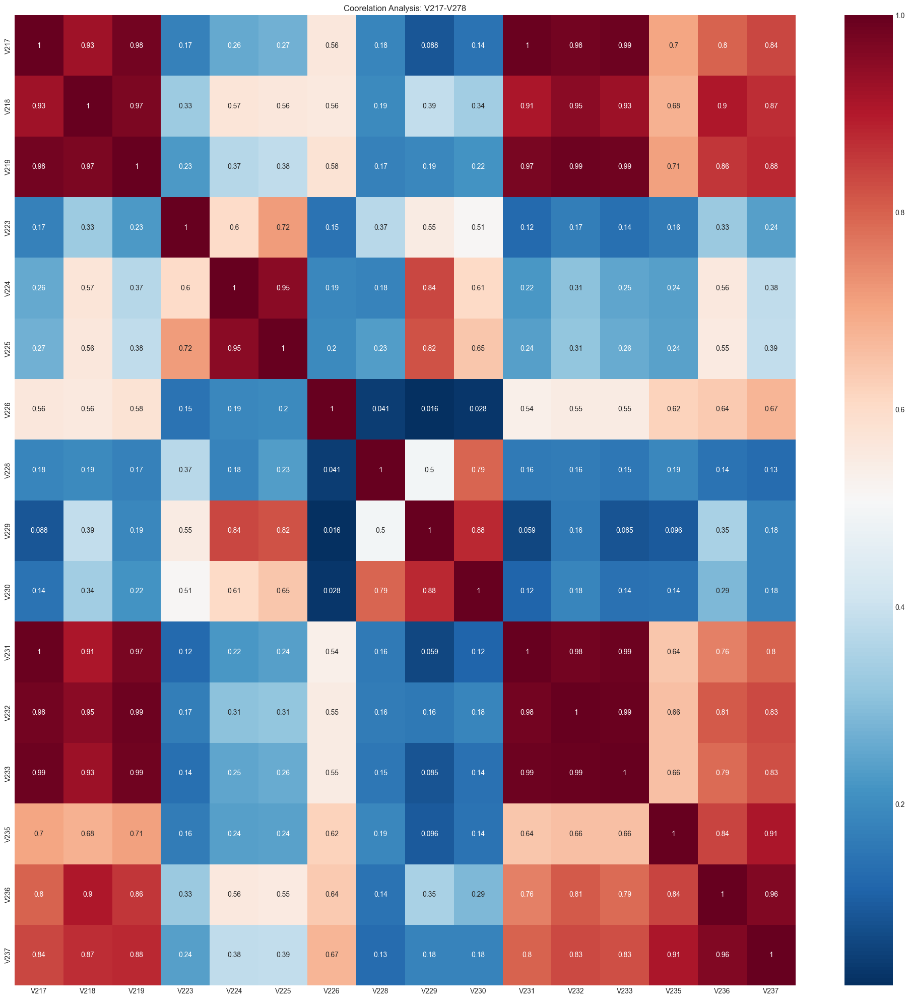

In [ ]:
cols = ['V217','V218','V219','V231','V232','V233','V236','V237','V223','V224','V225','V226','V228','V229','V230','V235']


coorelation_analysis(cols,title='Coorelation Analysis: V217-V278',size=(25,25))

In [ ]:
pairs = [['V217','V218','V219','V231','V232','V233','V236','V237'],['V223'],['V224','V225'],['V226'],['V228'],['V229','V230'],['V235']]
reduce_groups(pairs)

['V218', 'V223', 'V224', 'V226', 'V228', 'V229', 'V235']

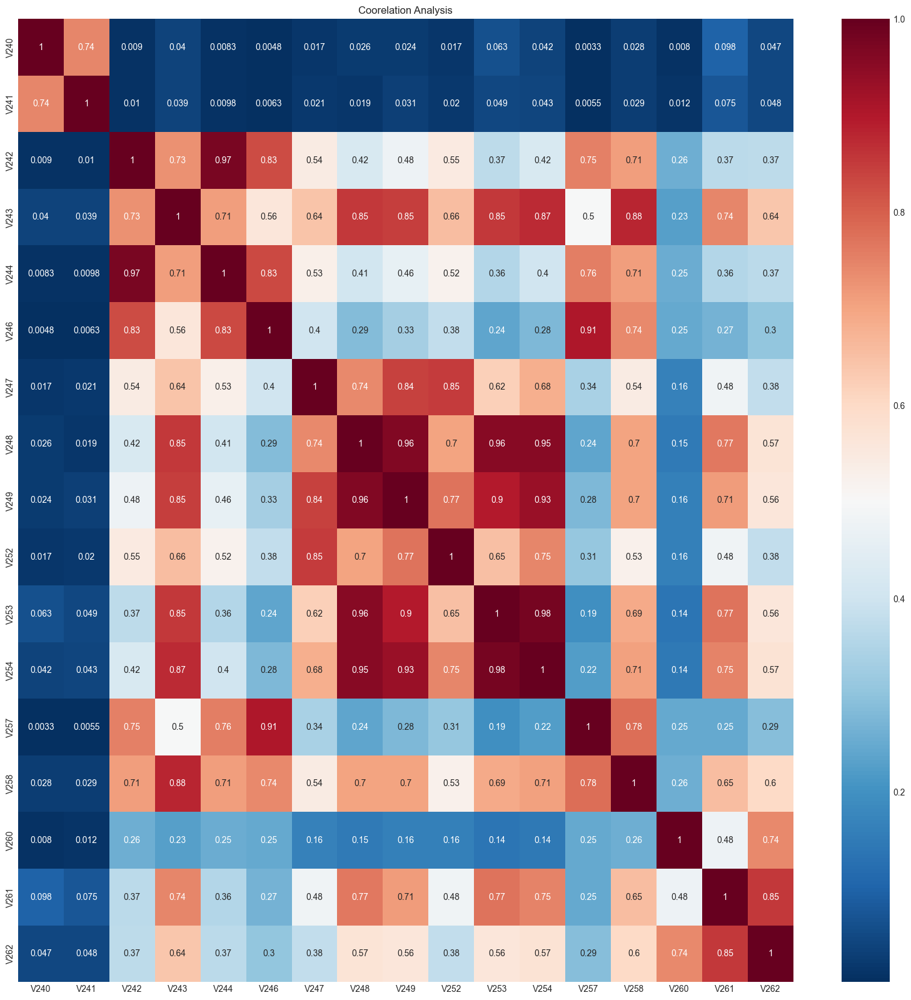

In [ ]:
cols = ['V240','V241','V242','V243','V244','V258','V246','V257','V247','V248','V249','V253','V254','V252','V260','V261','V262']

coorelation_analysis(cols,title='Coorelation Analysis',size=(20,20))

In [ ]:
pairs = [['V240','V241'],['V242','V243','V244','V258'],['V246','V257'],['V247','V248','V249','V253','V254'],['V252'],['V260'],['V261','V262']]

red_cols = reduce_groups(pairs)
red_cols

['V240', 'V258', 'V257', 'V253', 'V252', 'V260', 'V261']

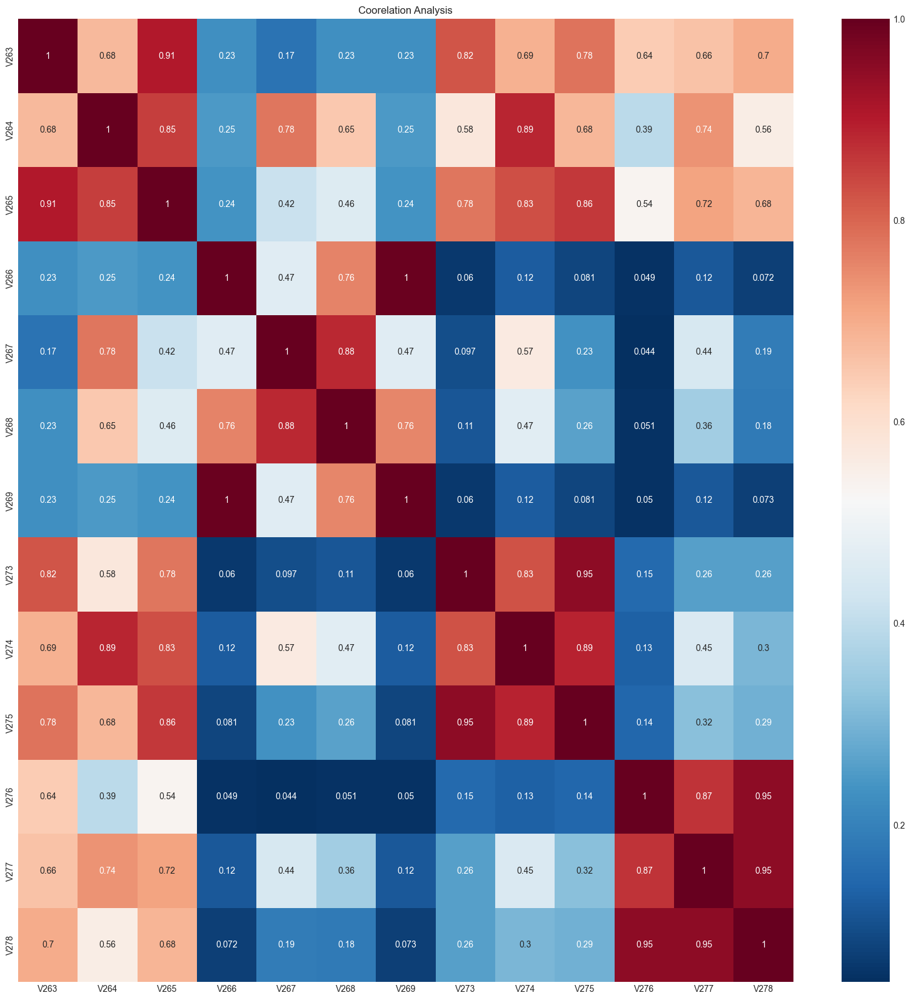

In [ ]:
cols =  ['V263','V265','V264','V266','V269','V267','V268','V273','V274','V275','V276','V277','V278']

coorelation_analysis(cols,title='Coorelation Analysis',size=(20,20))

In [ ]:
pairs =[['V263','V265','V264'],['V266','V269'],['V267','V268'],['V273','V274','V275'],['V276','V277','V278']]

reduce_groups(pairs)

['V264', 'V266', 'V267', 'V274', 'V277']

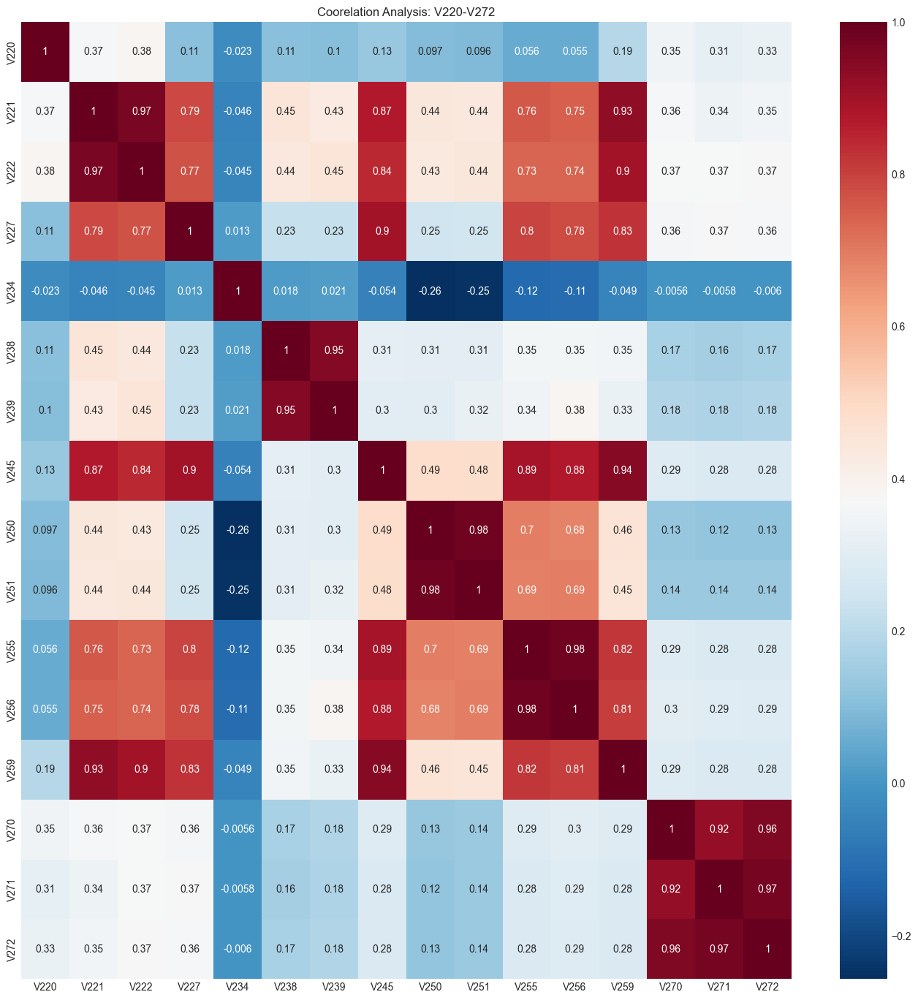

In [ ]:
cols = ['V245', 'V271', 'V234', 'V222', 'V238', 'V239', 'V227', 'V250',
 'V272', 'V270', 'V251', 'V220', 'V255', 'V256', 'V259', 'V221']

coorelation_analysis(cols,title='Coorelation Analysis: V220-V272',size=(17,17))


In [ ]:
pairs = [['V220'],['V221','V222','V227','V245','V255','V256','V259'],['V234'],['V238','V239'],
         ['V250','V251'],['V270','V271','V272']]

reduce_groups(pairs)

['V220', 'V221', 'V234', 'V238', 'V250', 'V271']

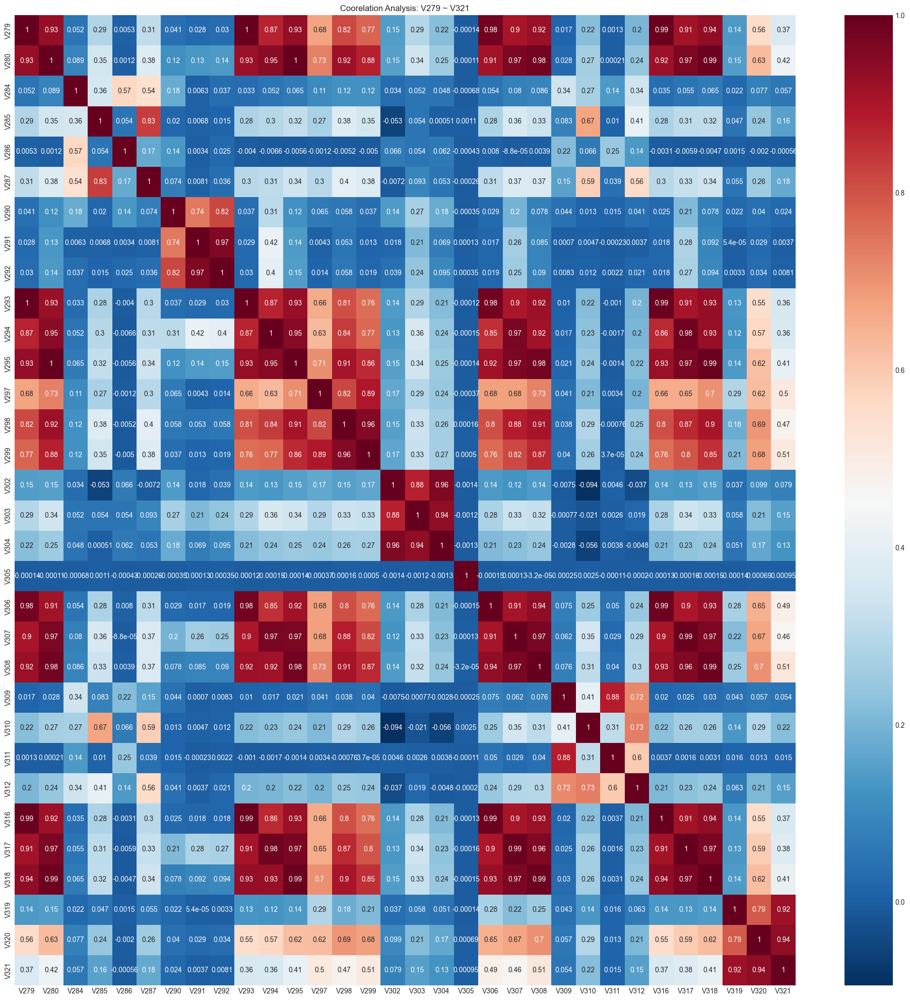

In [ ]:
cols = ['V311', 'V321', 'V294', 'V306', 'V305', 'V304', 'V303', 'V302', 'V299', 'V298', 'V297', 'V295',
        'V293', 'V308', 'V292', 'V291', 'V290', 'V287', 'V286', 'V285', 'V284', 'V280', 'V279',
        'V320', 'V307', 'V309', 'V312', 'V316', 'V317', 'V318', 'V319', 'V310']


coorelation_analysis(cols,title='Coorelation Analysis: V279 ~ V321',size=(25,25))

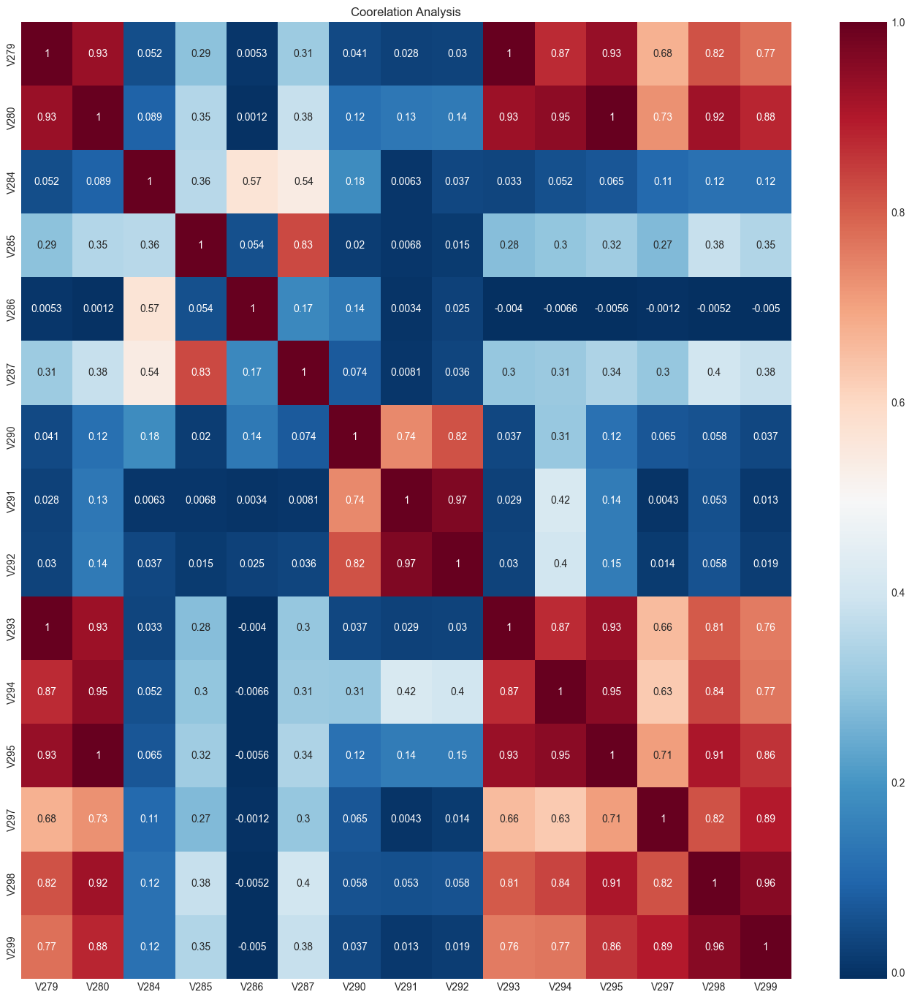

In [ ]:
cols = ['V279','V280','V293','V294','V295','V298','V299','V284','V285','V287','V286','V290','V291','V292','V297']

coorelation_analysis(cols,title='Coorelation Analysis',size=(17,17))

In [ ]:
pairs = [['V279','V280','V293','V294','V295','V298','V299'],['V284'],['V285','V287'],['V286'],['V290','V291','V292'],['V297']]

reduce_groups(pairs)

['V294', 'V284', 'V285', 'V286', 'V291', 'V297']

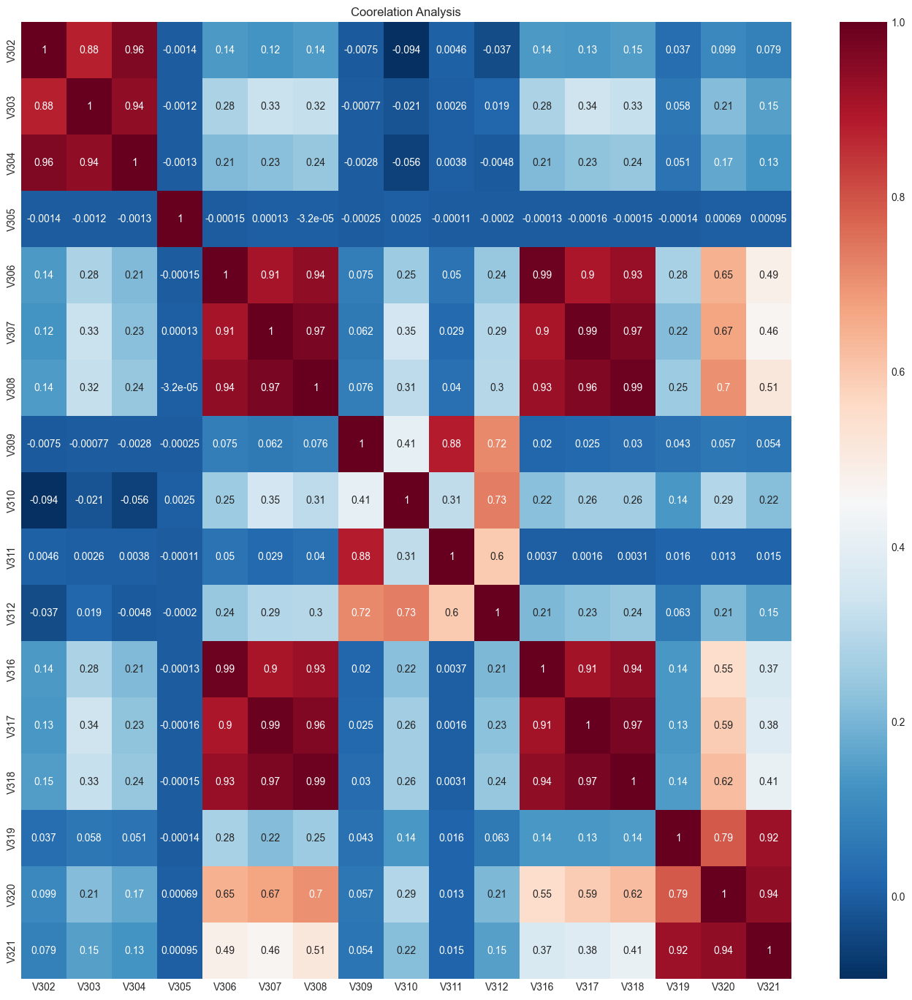

In [ ]:
cols = ['V302','V303','V304','V305','V306','V307','V308','V316','V317','V318','V309','V311','V310','V312','V319','V320','V321']

coorelation_analysis(cols,title='Coorelation Analysis',size=(17,17))

In [ ]:
pairs = [['V302','V303','V304'],['V305'],['V306','V307','V308','V316','V317','V318'],['V309','V311'],['V310','V312'],['V319','V320','V321']]
red_cols = reduce_groups(pairs)
red_cols

['V303', 'V305', 'V307', 'V309', 'V310', 'V320']

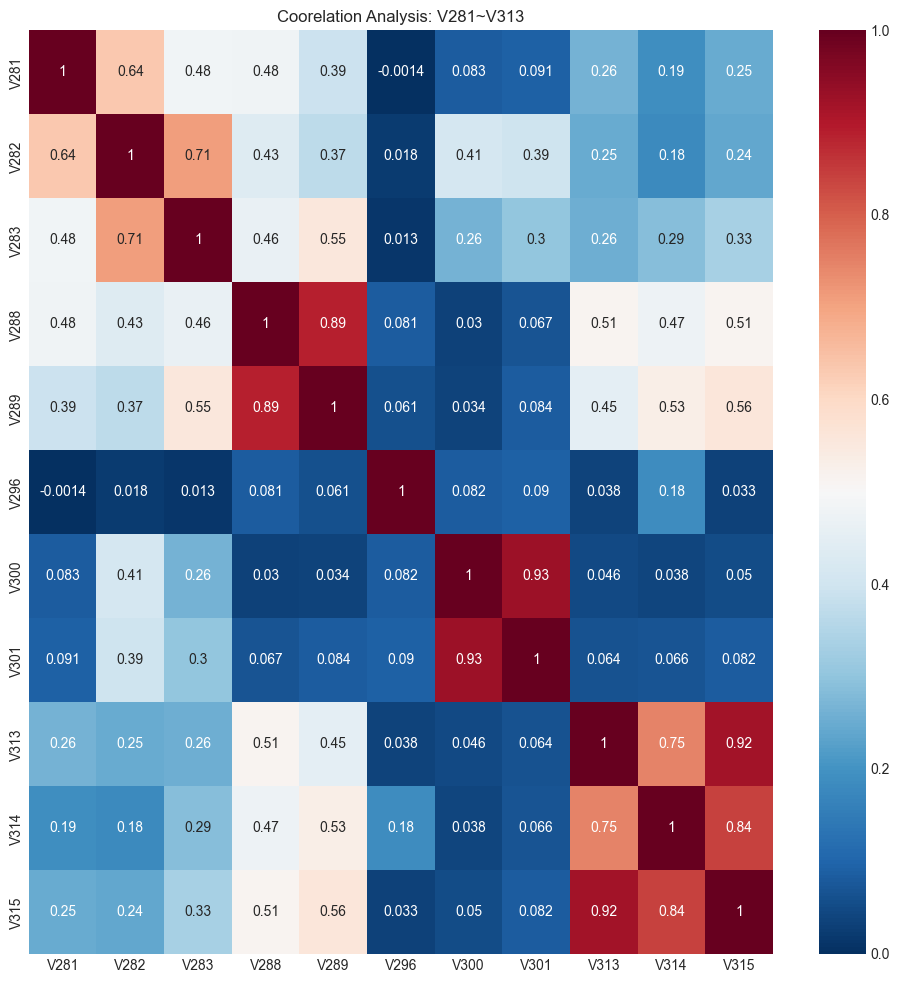

In [ ]:
cols = ['V296', 'V289', 'V288', 'V283', 'V282', 'V281', 'V300', 'V301', 'V313', 'V314', 'V315']

coorelation_analysis(cols,title='Coorelation Analysis: V281~V313',size=(12,12))

In [ ]:
pairs = [['V281'],['V282','V283'],['V288','V289'],['V296'],['V300','V301'],['V313','V314','V315']]

reduce_groups(pairs)

['V281', 'V283', 'V289', 'V296', 'V301', 'V314']

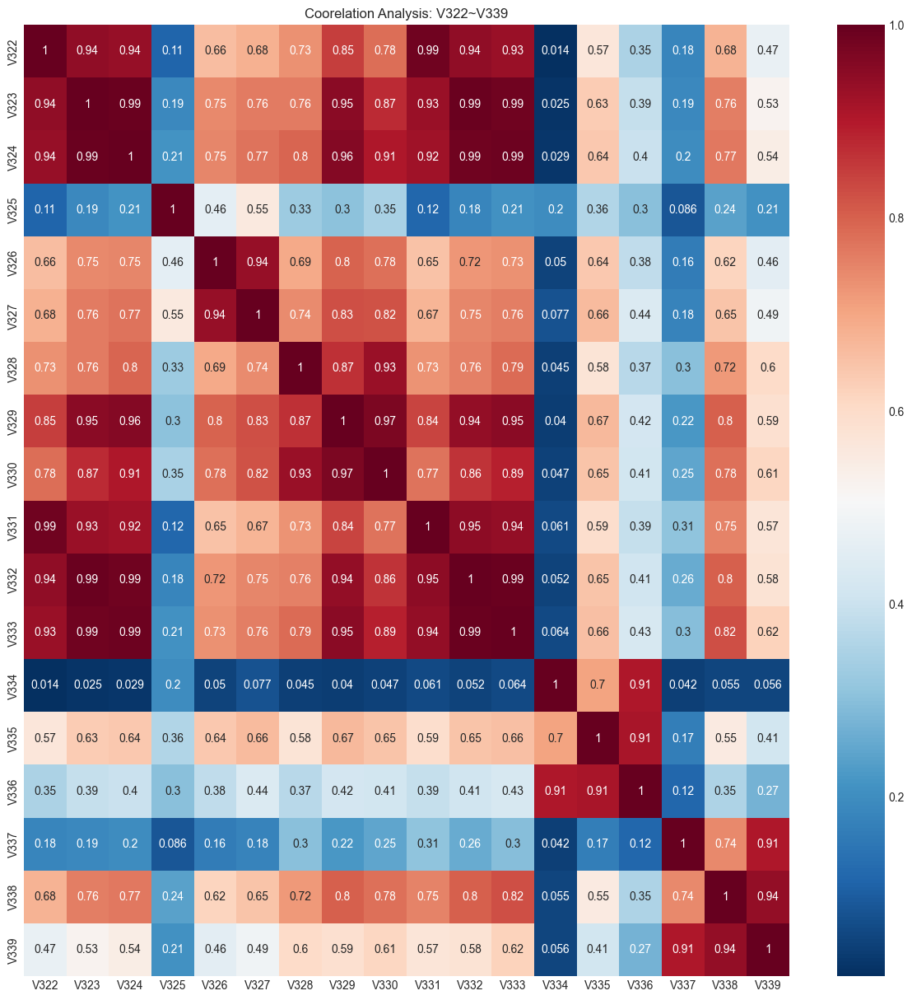

In [ ]:
cols = ['V337', 'V333', 'V336', 'V335', 'V334', 'V338', 'V339', 'V324',
 'V332', 'V325', 'V330', 'V329', 'V328', 'V327', 'V326', 'V322', 'V323', 'V331']

coorelation_analysis(cols,title='Coorelation Analysis: V322~V339',size=(15,15))

In [ ]:
pairs = [['V322','V323','V324','V326','V327','V328','V329','V330','V331','V332','V333'],['V325'],
         ['V334','V335','V336'],['V337','V338','V339']]

reduce_groups(pairs)

['V332', 'V325', 'V335', 'V338']

In [ ]:
reduced_vcols = ['V1', 'V3', 'V4', 'V6', 'V8', 'V11', 'V13', 'V14', 'V17', 'V20',
 'V23', 'V26', 'V27', 'V30', 'V36', 'V37', 'V40', 'V41', 'V44', 'V47', 'V48', 'V54', 'V56', 'V59',
 'V62', 'V65', 'V67', 'V68', 'V70', 'V76', 'V78', 'V80', 'V82', 'V86', 'V88', 'V89', 'V91', 'V96',
 'V98', 'V99', 'V104', 'V107', 'V108', 'V111', 'V115', 'V117', 'V120', 'V121', 'V123', 'V124', 'V127',
 'V129', 'V130', 'V136', 'V138', 'V139', 'V142', 'V147', 'V156', 'V162', 'V165', 'V160', 'V166', 'V178',
 'V176', 'V173', 'V182', 'V187', 'V203', 'V205', 'V207', 'V215', 'V169', 'V171', 'V175', 'V180', 'V185',
 'V188', 'V198', 'V210', 'V209', 'V218', 'V223', 'V224', 'V226', 'V228', 'V229', 'V235', 'V240', 'V258',
 'V257', 'V253', 'V252', 'V260', 'V261', 'V264', 'V266', 'V267', 'V274', 'V277', 'V220', 'V221', 'V234',
 'V238', 'V250', 'V271', 'V294', 'V284', 'V285', 'V286', 'V291',
 'V297', 'V303', 'V305', 'V307', 'V309', 'V310', 'V320', 'V281', 'V283', 'V289', 'V296', 'V301', 'V314', 'V332', 'V325', 'V335', 'V338']

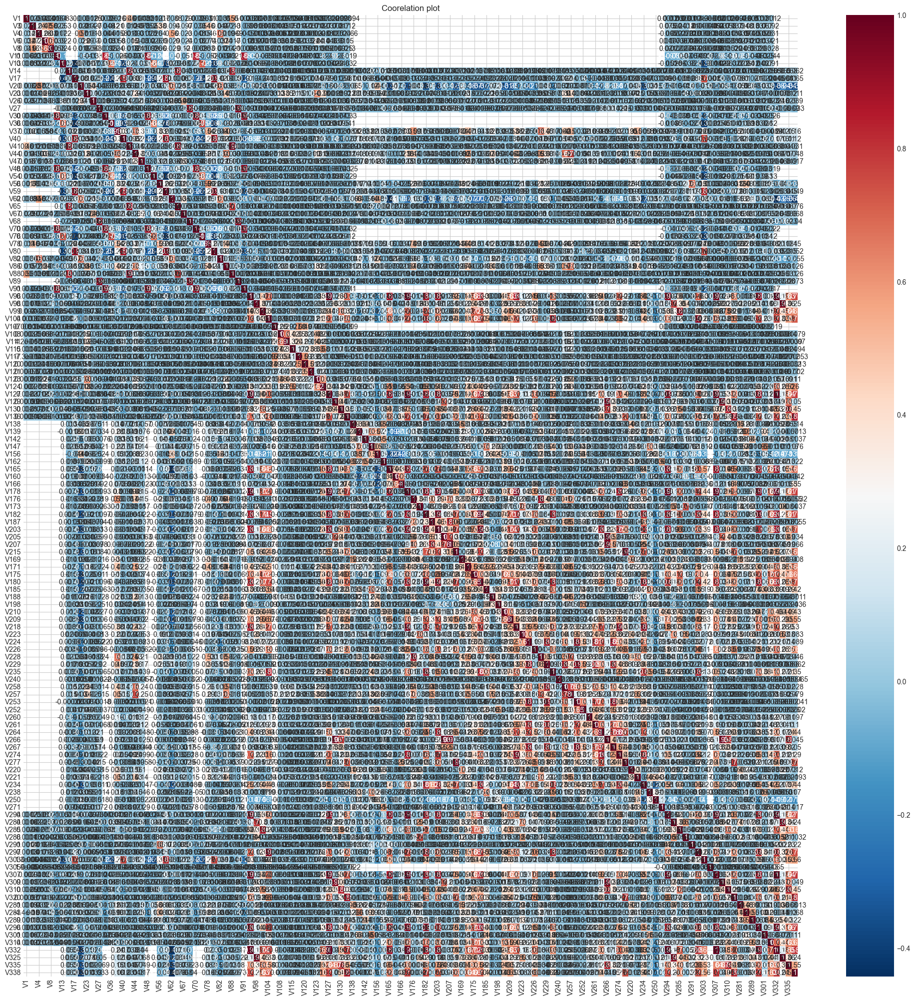

In [ ]:
fig,axes = plt.subplots(1,1,figsize=(25,25))
df_corr = df_train[reduced_vcols].corr()
sns.heatmap(df_corr,annot=True,cmap='RdBu_r')
axes.title.set_text('Coorelation plot')
plt.show()

### 2.7.3 Analysis on **M Columns**

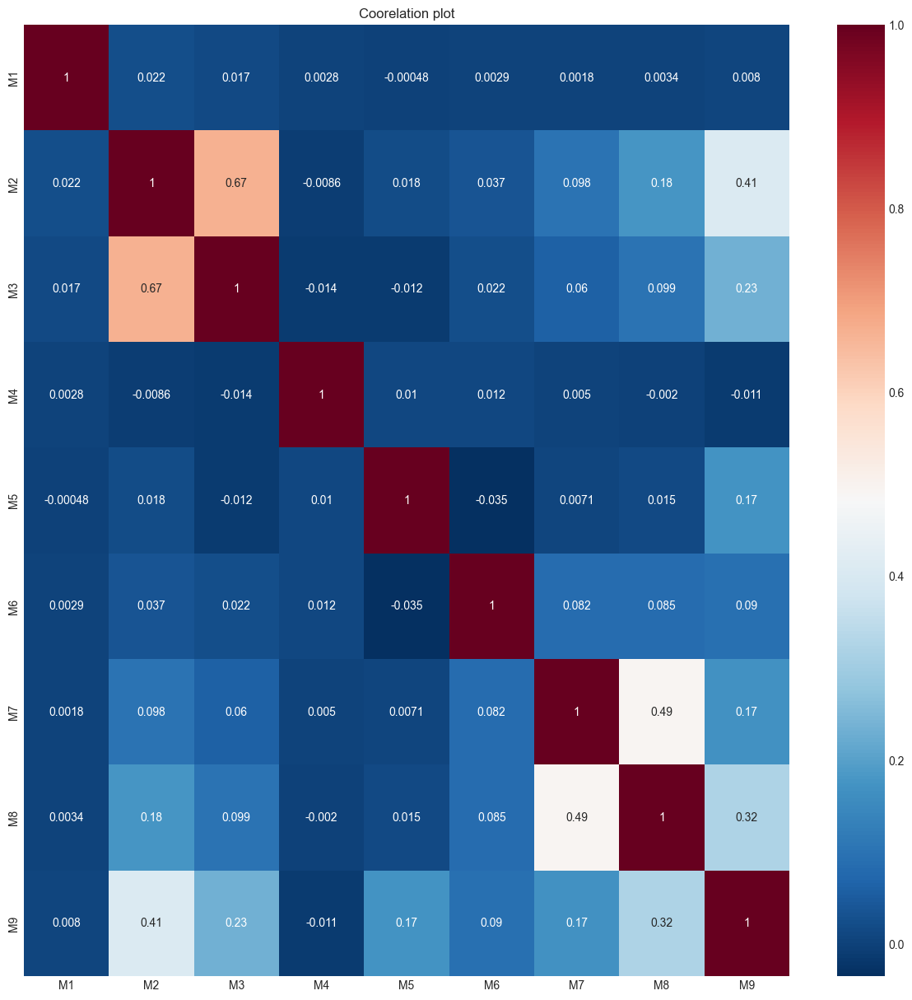

In [ ]:
m_cols = [col for col in df_train.columns if col[0] == 'M']

mp = {'F':0,'T':1,'M0':0,'M1':1,'M2':2}
for c in m_cols: df_train[c] = df_train[c].map(mp)

fig,axes = plt.subplots(1,1,figsize=(15,15))
df_corr = df_train[m_cols].corr()
sns.heatmap(df_corr,annot=True,cmap='RdBu_r')
axes.title.set_text('Coorelation plot')
plt.show()

### 2.7.4 Analysis on **D Columns**

In [ ]:
d_cols = [col for col in df_train.columns if col[0] == 'D']

In [ ]:
df_train[d_cols].head()

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,DeviceType,DeviceInfo
0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,NaN,NaN
1,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN
2,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,NaN,NaN
3,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,NaN,NaN
4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,mobile,SAMSUNG SM-G892A Build/NRD90M


In [ ]:
D_col_with_Numerical_values = ['D'+str(x) for x in range(1,16)]

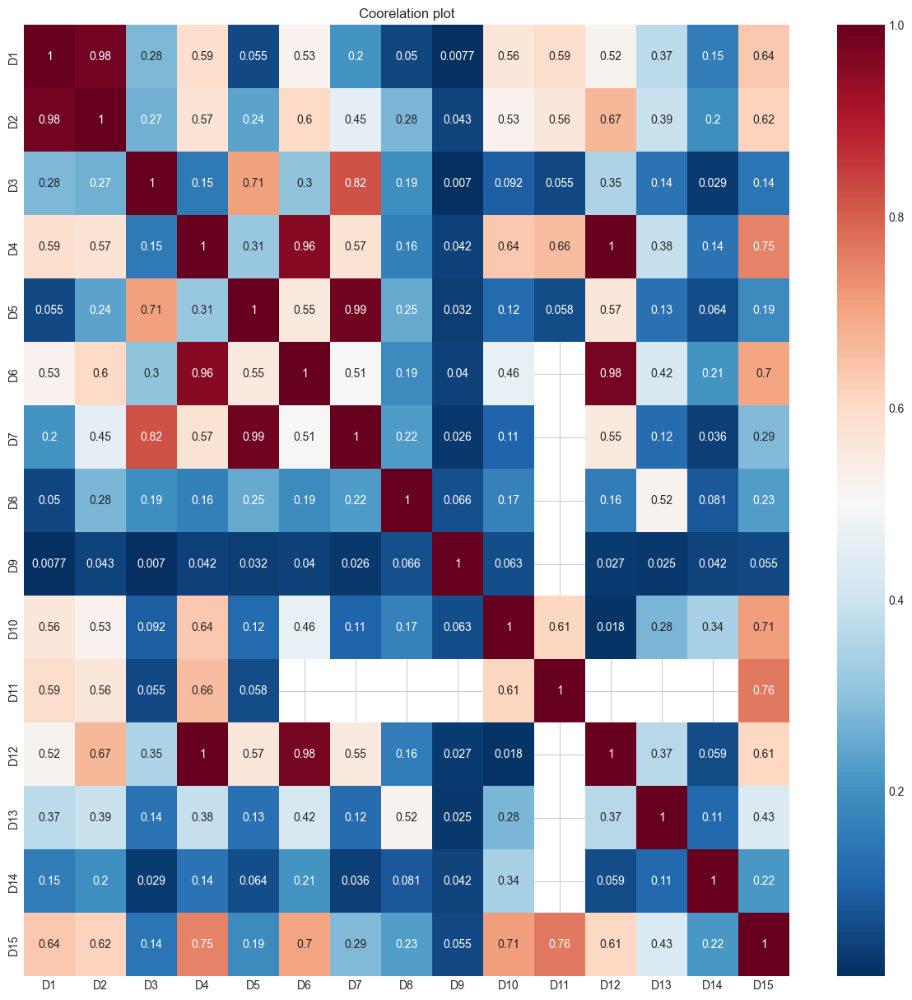

In [ ]:


fig,axes = plt.subplots(1,1,figsize=(15,15))
df_corr = df_train[D_col_with_Numerical_values].corr()
sns.heatmap(df_corr,annot=True,cmap='RdBu_r')
axes.title.set_text('Coorelation plot')
plt.show()

##  2.8. Final Model with Feature Selection Reduce

In [ ]:
# column details
cat_cols = (['ProductCD'] +
            ['card%d' % i for i in range(1, 7)] +
            ['addr1', 'addr2', 'P_emaildomain', 'R_emaildomain'] +
            ['M%d' % i for i in range(1, 10)] +
            ['DeviceType', 'DeviceInfo'] +
            ['id_%d' % i for i in range(12, 39)])


type_map = {c: str for c in cat_cols}
df_train[cat_cols] = df_train[cat_cols].astype(type_map, copy=False)
df_test[cat_cols] = df_test[cat_cols].astype(type_map, copy=False)

######################################################################################

id_cols = ['TransactionID', 'TransactionDT']
target = 'isFraud'

numeric_cols =  [
    'TransactionAmt', 'dist1', 'dist2', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10',
    'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11',
    'D12', 'D13', 'D14', 'D15', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
    'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25',
    'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39',
    'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53',
    'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67',
    'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81',
    'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95',
    'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108',
    'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120',
    'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132',
    'V133', 'V134', 'V135', 'V136', 'V137', 'V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144',
    'V145', 'V146', 'V147', 'V148', 'V149', 'V150', 'V151', 'V152', 'V153', 'V154', 'V155', 'V156',
    'V157', 'V158', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168',
    'V169', 'V170', 'V171', 'V172', 'V173', 'V174', 'V175', 'V176', 'V177', 'V178', 'V179', 'V180',
    'V181', 'V182', 'V183', 'V184', 'V185', 'V186', 'V187', 'V188', 'V189', 'V190', 'V191', 'V192',
    'V193', 'V194', 'V195', 'V196', 'V197', 'V198', 'V199', 'V200', 'V201', 'V202', 'V203', 'V204',
    'V205', 'V206', 'V207', 'V208', 'V209', 'V210', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216',
    'V217', 'V218', 'V219', 'V220', 'V221', 'V222', 'V223', 'V224', 'V225', 'V226', 'V227', 'V228',
    'V229', 'V230', 'V231', 'V232', 'V233', 'V234', 'V235', 'V236', 'V237', 'V238', 'V239', 'V240',
    'V241', 'V242', 'V243', 'V244', 'V245', 'V246', 'V247', 'V248', 'V249', 'V250', 'V251', 'V252',
    'V253', 'V254', 'V255', 'V256', 'V257', 'V258', 'V259', 'V260', 'V261', 'V262', 'V263', 'V264',
    'V265', 'V266', 'V267', 'V268', 'V269', 'V270', 'V271', 'V272', 'V273', 'V274', 'V275', 'V276',
    'V277', 'V278', 'V279', 'V280', 'V281', 'V282', 'V283', 'V284', 'V285', 'V286', 'V287', 'V288',
    'V289', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V296', 'V297', 'V298', 'V299', 'V300',
    'V301', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312',
    'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321', 'V322', 'V323', 'V324',
    'V325', 'V326', 'V327', 'V328', 'V329', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336',
    'V337', 'V338', 'V339', 'id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_07', 'id_08',
    'id_09', 'id_10', 'id_11'
]


reduced_vcols = ['V1', 'V3', 'V4', 'V6', 'V8', 'V11', 'V13', 'V14', 'V17', 'V20',
 'V23', 'V26', 'V27', 'V30', 'V36', 'V37', 'V40', 'V41', 'V44', 'V47', 'V48', 'V54', 'V56', 'V59',
 'V62', 'V65', 'V67', 'V68', 'V70', 'V76', 'V78', 'V80', 'V82', 'V86', 'V88', 'V89', 'V91', 'V96',
 'V98', 'V99', 'V104', 'V107', 'V108', 'V111', 'V115', 'V117', 'V120', 'V121', 'V123', 'V124', 'V127',
 'V129', 'V130', 'V136', 'V138', 'V139', 'V142', 'V147', 'V156', 'V162', 'V165', 'V160', 'V166', 'V178',
 'V176', 'V173', 'V182', 'V187', 'V203', 'V205', 'V207', 'V215', 'V169', 'V171', 'V175', 'V180', 'V185',
 'V188', 'V198', 'V210', 'V209', 'V218', 'V223', 'V224', 'V226', 'V228', 'V229', 'V235', 'V240', 'V258',
 'V257', 'V253', 'V252', 'V260', 'V261', 'V264', 'V266', 'V267', 'V274', 'V277', 'V220', 'V221', 'V234',
 'V238', 'V250', 'V271', 'V294', 'V284', 'V285', 'V286', 'V291',
 'V297', 'V303', 'V305', 'V307', 'V309', 'V310', 'V320', 'V281', 'V283', 'V289', 'V296', 'V301', 'V314', 'V332', 'V325', 'V335', 'V338']

In [ ]:
# droping v cols
drop_cols = [col for col in df_train.columns if col[0] == 'V' and col not in reduced_vcols]

print(f'dropping {len(drop_cols)} columns')
df_train = df_train.drop(columns=drop_cols)
df_test = df_test.drop(columns=drop_cols)

dropping 211 columns


    We were able to reduce the amount of columns by 50%

### 2.8.1 Train - Test Split

In [ ]:
## Train and test split¶
y_train = df_train['isFraud']
X_train = df_train.drop(columns=['isFraud'])
X_test = df_test.copy()

print(X_train.shape)
print(X_test.shape)
gc.collect()

(590540, 222)
(506691, 222)


804887

### 2.8.2 Preprocessing (again)

In [ ]:
# Label encoding all cat features
for col in X_train.columns:

    if col in cat_cols:
        # label encode all cat columns
        dff = pd.concat([X_train[col],X_test[col]])
        dff,_ = pd.factorize(dff,sort=True)
        if dff.max()>32000:
            print(col,'needs int32 datatype')

        X_train[col] = dff[:len(X_train)].astype('int16')
        X_test[col] = dff[len(X_train):].astype('int16')

In [ ]:
rem_cols = []
rem_cols.extend(['TransactionDT','TransactionID'])

cols = [col for col in X_train.columns if col not in rem_cols]
len(cols)

220

In [ ]:
# Scaling numeric features
for col in cols:
    if col not in cat_cols:
        # min max scalar
        dff = pd.concat([X_train[col],X_test[col]])
        dff = (dff - dff.min())/(dff.max() - dff.min())
        dff.fillna(-1,inplace=True)

        X_train[col] = dff[:len(X_train)]
        X_test[col] = dff[len(X_train):]

del dff

### 2.8.3 Taining Process on final model

In [ ]:
x_train = X_train[cols]
x_test = X_test[cols]


idx_train = x_train.index[:int(x_train.shape[0]*0.75)]
idx_validation = x_train.index[int(x_train.shape[0]*0.75):]

print(f'fitting model on {len(cols)} columns')
clf = xgb.XGBClassifier(
        n_estimators=2000,
        max_depth=12,
        learning_rate=0.02,
        subsample=0.8,
        colsample_bytree=0.4,
        missing=-1,
        eval_metric='auc',
        tree_method='gpu_hist'
          )
model = clf.fit(x_train.loc[idx_train,cols], y_train[idx_train],
            eval_set=[(x_train.loc[idx_validation,cols],y_train[idx_validation])],
            verbose=50, early_stopping_rounds=100)

fitting model on 220 columns
[0]	validation_0-auc:0.82739
[50]	validation_0-auc:0.88074
[100]	validation_0-auc:0.89212
[150]	validation_0-auc:0.90154
[200]	validation_0-auc:0.90848
[250]	validation_0-auc:0.91465
[300]	validation_0-auc:0.91905
[350]	validation_0-auc:0.92112
[400]	validation_0-auc:0.92233
[450]	validation_0-auc:0.92292
[500]	validation_0-auc:0.92292
[550]	validation_0-auc:0.92310
[600]	validation_0-auc:0.92301
[650]	validation_0-auc:0.92266
[653]	validation_0-auc:0.92267


### 2.8.4 Metric Evaluation

In [ ]:

y_train_pred = model.predict(x_train.iloc[idx_train])
y_test_pred = model.predict(x_train.iloc[idx_validation])

train_fpr, train_tpr, thresholds = roc_curve(y_train.iloc[idx_train], model.predict_proba(x_train.iloc[idx_train])[:,1])
test_fpr, test_tpr, thresholds = roc_curve(y_train.iloc[idx_validation], model.predict_proba(x_train.iloc[idx_validation])[:,1])

#Area under ROC curve
print('Area under train roc {}'.format(auc(train_fpr, train_tpr)))
print('Area under test roc {}'.format(auc(test_fpr, test_tpr)))

Area under train roc 0.9924424107163152
Area under test roc 0.923248236243317


### 2.8.5 Confusion Matrix

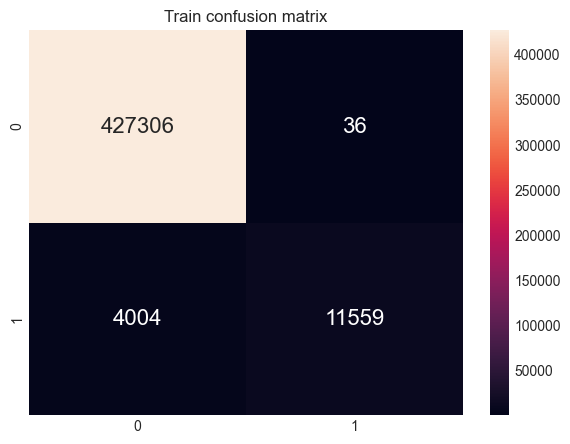

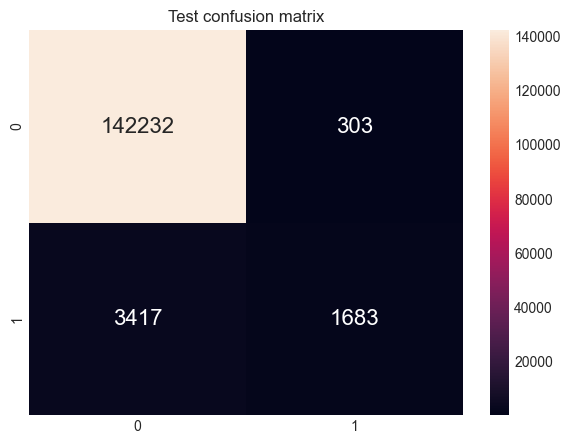

In [ ]:
train_cf = confusion_matrix(y_train.iloc[idx_train],y_train_pred)
plt.figure(figsize=(7,5))
sns.heatmap(train_cf,annot=True,annot_kws={"size": 16},fmt="0")
plt.title('Train confusion matrix')
plt.show()


cv_cf = confusion_matrix(y_train.iloc[idx_validation],y_test_pred)
plt.figure(figsize=(7,5))
sns.heatmap(cv_cf,annot=True,annot_kws={"size": 16},fmt="0")
plt.title('Test confusion matrix')
plt.show()

In [ ]:
# Further updated Train data metrics
train_TN, train_FP, train_FN, train_TP = 427306, 36, 4004, 11559

train_accuracy = (train_TN + train_TP) / (train_TN + train_FP + train_FN + train_TP)
train_precision = train_TP / (train_TP + train_FP)
train_recall = train_TP / (train_TP + train_FN)
train_f1_score = (2 * train_precision * train_recall) / (train_precision + train_recall)

# Further updated Test data metrics
test_TN, test_FP, test_FN, test_TP = 142232, 303, 3417, 1683

test_accuracy = (test_TN + test_TP) / (test_TN + test_FP + test_FN + test_TP)
test_precision = test_TP / (test_TP + test_FP)
test_recall = test_TP / (test_TP + test_FN)
test_f1_score = (2 * test_precision * test_recall) / (test_precision + test_recall)

train_metrics_further_updated = {
    'Accuracy': train_accuracy,
    'Precision': train_precision,
    'Recall': train_recall,
    'F1-Score': train_f1_score
}

test_metrics_further_updated = {
    'Accuracy': test_accuracy,
    'Precision': test_precision,
    'Recall': test_recall,
    'F1-Score': test_f1_score
}

train_metrics_further_updated, test_metrics_further_updated


Precision: 84.74%
Recall: 33.00%
F1-Score: 47.50%
Interpretation:

Accuracy: The accuracy remains high for both sets.

Precision: There's a significant improvement in the precision for the training data, which is nearly perfect at 99.69%. This means that almost all transactions flagged as fraudulent were indeed fraudulent. The precision for the test data is also robust at 84.74%.

Recall (Sensitivity): Recall for the training data has improved to 74.27%, which means the model is detecting a greater percentage of actual fraudulent transactions. However, for the test data, the recall remains at 33%, indicating that the model is still missing a significant portion of fraudulent transactions in the test set.

F1-Score: The F1-Score, which balances precision and recall, has improved for the training data to 85.12%. For the test data, it remains around 47.50%.

    The updated model shows remarkable improvement in precision, reaching nearly perfect accuracy in identifying fraudulent transactions in both training and test datasets. However, while the model's ability to detect actual frauds (recall) has increased significantly in the training data, it still misses a substantial portion of fraudulent transactions in the test set, leading to a relatively lower recall and F1-Score. Despite high precision, the model's effectiveness in capturing all instances of fraud, especially in the test data, remains a challenge.

________________________________________________________________________________________________________________________________________

# 3. **Submission File**

In [ ]:
y_pred_test = model.predict_proba(x_test)[:,1]
submission = pd.read_csv('sample_submission.csv')
submission['isFraud'] = y_pred_test
submission.to_csv('submission.csv',index=False)
submission.head()

,TransactionID,isFraud
0,3663549,0.001994
1,3663550,0.002416
2,3663551,0.004347
3,3663552,0.002419
4,3663553,0.004388
